## Preparation

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams.update({'font.size': 12})

from scipy.io import wavfile
from skimage import io

from numpy.fft import fft, ifft, fft2, ifft2
from scipy.fftpack import dct, idct
from pywt import dwt, idwt, dwt2, idwt2

from preprocessing import signal_to_2d, signal_to_1d, split_into_frames, combine_frames
from watermarking import SVDWatermarking, SchurWatermarking
from watermarking import watermark_single, extract_from_single, watermark_many, extract_from_many
from metrics import snr, nc
from plotting import plot_signals, plot_watermarks, plot_signal_attacks, plot_watermarks_comp

import os
DATA_DIR = 'data'
DEMO_SIGNAL = os.path.join(DATA_DIR, 'vocals2.wav')
DEMO_WATERMARK = os.path.join(DATA_DIR, 'qr.png')

Reading the demo audio and watermark:

Signal rate: 44100
Shape: (705570,)


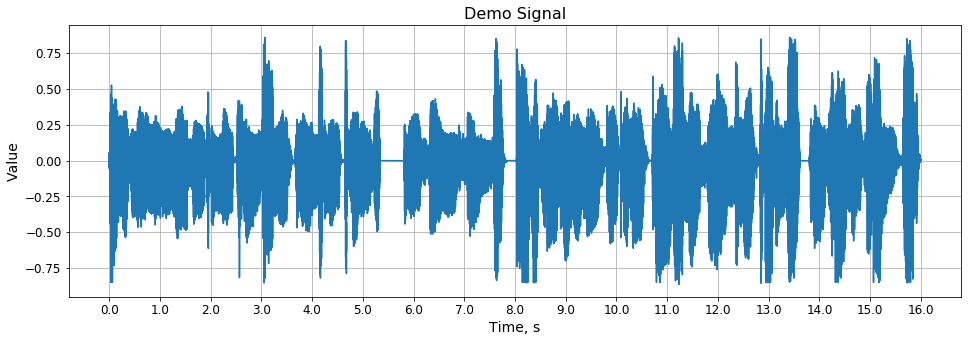

In [2]:
rate, data = wavfile.read(DEMO_SIGNAL)

# scaling data into range [-1, 1]
def scale_wav(data):
    wav_scaling_factors = {'float32': 1., 'int32': 2**31, 'int16': 2**15}
    return data / wav_scaling_factors[str(data.dtype)]

data = scale_wav(data)

signal = data[:, 0]  # taking the first channel
signal_len = signal.shape[0]

x_ticks = np.arange(0, signal_len + rate, rate)
x_labels = list(map(str, x_ticks / rate))

print('Signal rate:', rate)
print('Shape:', signal.shape)

fig, ax = plt.subplots(figsize=(16, 5))
ax.plot(signal)
ax.set_title('Demo Signal', fontsize=16)
ax.set_xlabel('Time, s', fontsize=14)
ax.set_ylabel('Value', fontsize=14)
ax.set_xticks(x_ticks)
ax.set_xticklabels(x_labels)
ax.grid()
plt.show()

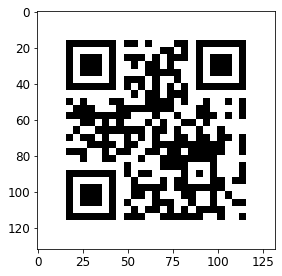

In [3]:
watermark = io.imread(DEMO_WATERMARK)
watermark = watermark / 255

w_height, w_width = watermark.shape

io.imshow(watermark)

# SVD-based watermarking

SVD-based watermarking is defined as:

* Emdedding process:
$$\begin{align}
A^{2D} &= U_{A}\Sigma_{A}V^{T}_{A} \\
\tilde{\Sigma}_{A} &= \Sigma_{A}+k \Sigma_{w} \cdot \frac{||A||_2}{||W||_2} = \Sigma_{A}+k \Sigma_{w} \cdot \frac{\sigma_{A, 1}}{\sigma_{w, 1}} \\
A^{2D}_{w} &= U_{A}\tilde{\Sigma}_{A}V^{T}_{A}
\end{align}$$

* Extraction process:
$$\begin{align}
A^{2D}_{w} &= U_{A}\tilde{\Sigma}_{A}V^{T}_{A} \\
\tilde{\Sigma}_{w} &= \frac{\tilde{\Sigma}_{A}-\Sigma_{A}}{k} \cdot \frac{||W||_2}{||A||_2} \\
\tilde{W} &= U_{w}\tilde{\Sigma}_{w}V^{T}_{w}
\end{align},$$

where $k$ is the watermark strength, hyperparameter of the algorithm, and $\frac{||A||_2}{||W||_2}$ is the  scaling factor defined as the ratio of the maximum singular values of matrices $A$ and $W$.

SVD-based watermarking is applied to the:
* raw signal in time domain as a 2D matrix
* signal after 1D DWT + 2D matrix form
* 2D matrix form + 2D DWT
* signal after 1D FFT, real values + 2D matrix form
* 2D matrix form + 2D FFT, real values

The watermarking is embedded in two extreme cases: 
* once for the whole signal
* separately into each each frame of the same size as the watermark

Signal-to-noise Ratio is computed for each audio with embedded watermark.

In [4]:
# embedding tolerance ratio for this section of the demo
k = 0.01

## Raw signal in time domain

Trasforming 1D signal of shape `(length,)` into a 2D matrix of shape `(w_height, np.ceil(signal_len // w_height)`, where `w_height` is the watermark height.

After that SVD-based watermarking is applied for the whole signal, and for the frames of size `(w_height, w_width)`.

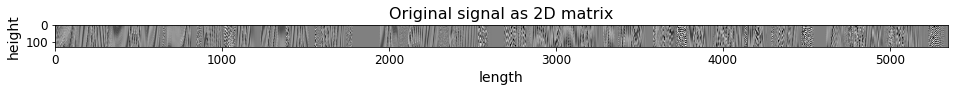

In [5]:
signal_mat = signal_to_2d(signal, w_height)

fig, ax = plt.subplots(figsize=(16, 5))
ax.set_title('Original signal as 2D matrix', fontsize=16)
ax.set_xlabel('length', fontsize=14)
ax.set_ylabel('height', fontsize=14)
ax.imshow(signal_mat, cmap='gray')
plt.show()

### Whole audio

Embedding the watermark into the whole signal:

#### SVD-based watermarking without sigular value scaling:

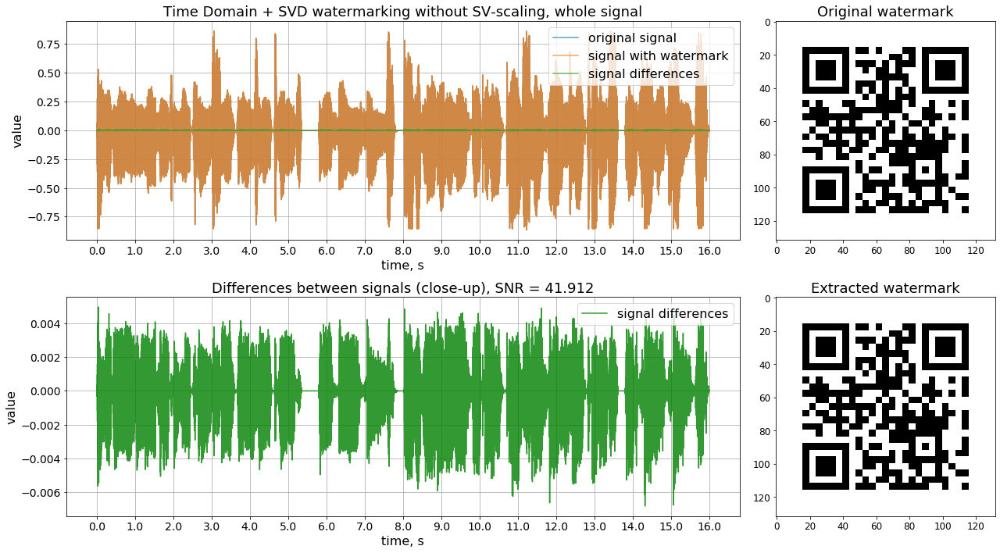

In [6]:
# SVD-based watermarking
svd_wat_nosc = SVDWatermarking(watermark, scale_svs=False)

# embedding the watermark into a 2D matrix
signal_mat_w, wp_data = watermark_single(signal_mat, model=svd_wat_nosc, k=k)

# getting 1D signal
signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)

# extracting the watermark
extracted_watermark = extract_from_single(signal_mat_w, svd_wat_nosc, wp_data, k=k)

# plotting
plot_signals(signal, signal_w, watermark, extracted_watermark, 
             main_title='Time Domain + SVD watermarking without SV-scaling, whole signal',
             x_ticks=x_ticks, x_labels=x_labels)

#### SVD-based watermarking ***with*** sigular value scaling:

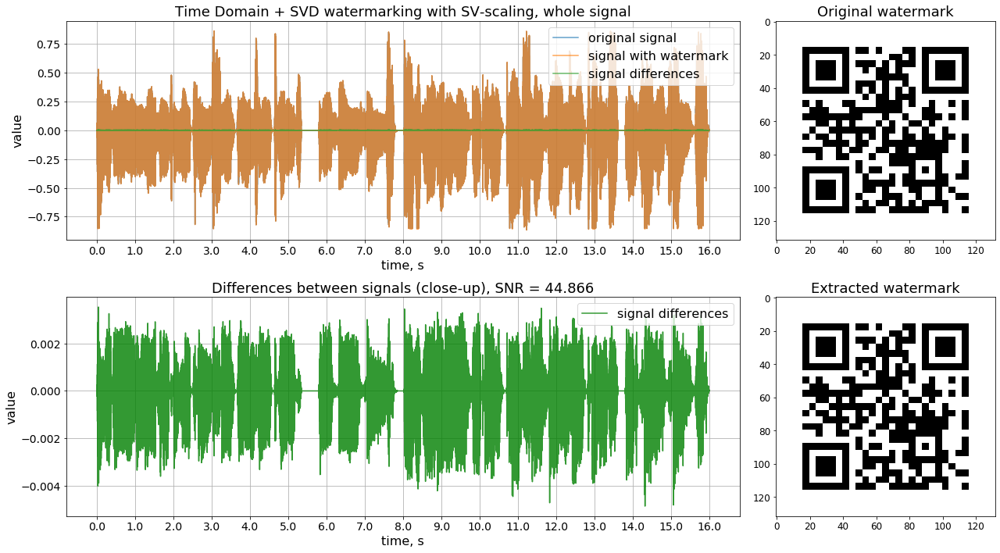

In [7]:
# SVD-based watermarking
svd_wat = SVDWatermarking(watermark, scale_svs=True)

# embedding the watermark into a 2D matrix
signal_mat_w, wp_data = watermark_single(signal_mat, model=svd_wat, k=k)

# getting 1D signal
signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)

# extracting the watermark
extracted_watermark = extract_from_single(signal_mat_w, svd_wat, wp_data, k=k)

# plotting
plot_signals(signal, signal_w, watermark, extracted_watermark,
             main_title='Time Domain + SVD watermarking with SV-scaling, whole signal',
             x_ticks=x_ticks, x_labels=x_labels)

Signal-to-noise ratio is better with singular value scaling, let's stick with it!

### Split into frames of watermark size

Splitting the 2D matrix of the signal into frames of size `(w_height, w_width)` and embedding the watermark into each frame.

In [8]:
frames = split_into_frames(signal_mat, w_width)
frame_borders = np.arange(0, signal_len + 1, w_height * w_width)
len(frames), frames[0].shape

(41, (132, 132))

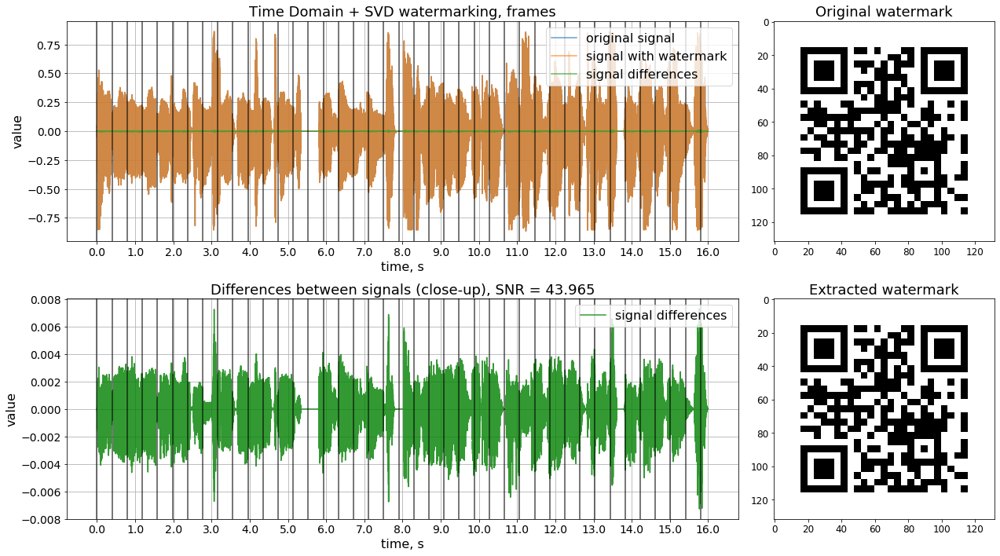

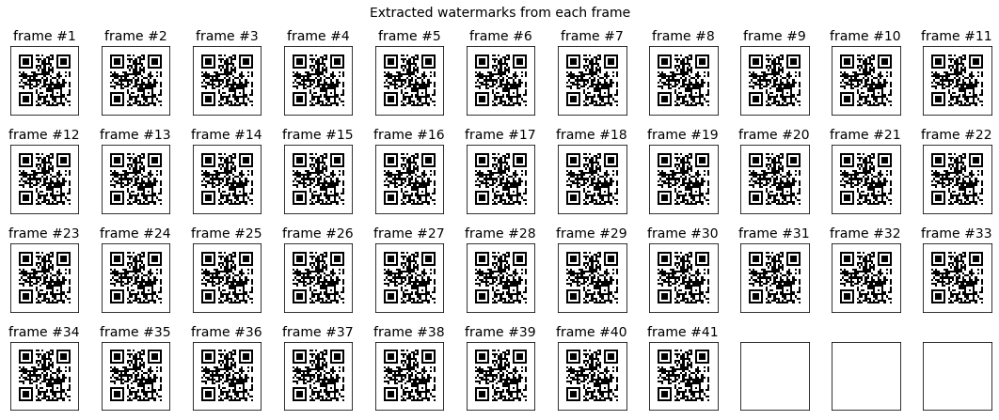

In [9]:
# embedding the watermark into a 2D matrix
frames_w, wp_data = watermark_many(frames, model=svd_wat, k=k)

# getting 1D signal by combining and trasforming frames
signal_mat_w = combine_frames(frames_w)
signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)

# extracting the watermark
signal_mat_w = signal_to_2d(signal_w, w_height)
frames_w = split_into_frames(signal_mat_w, w_width)
extracted_watermarks = extract_from_many(frames_w, svd_wat, wp_data, k=k)

# plotting
plot_signals(signal, signal_w, watermark, extracted_watermarks[0],
             main_title='Time Domain + SVD watermarking, frames',
             frame_borders=frame_borders,
             x_ticks=x_ticks, x_labels=x_labels)

# plottign all extracted watermarks
plot_watermarks(extracted_watermarks, rows=4, cols=11, figsize=(15, 6),
                names=[f'frame #{i+1}' for i in range(len(frames))] + [''],
                title='Extracted watermarks from each frame')

Quite lower SNR, if we increase the frame size, the value will be in between these two demonstrated extreme cases.

## DWT of 1D signal

* Applying **Discrete Wavelet Transform (DWT)** for the original signal
* Transforming the singal approximation coefficients into 2D matrix
* Embedding the watermark
* Applying inverse transformation

### 1D Discrete Wavelet Transform (DWT)

DWT tranforms the signal into approximation and details signals of size `signal_len / 2`. The watermark can be embedded into the approximation part.

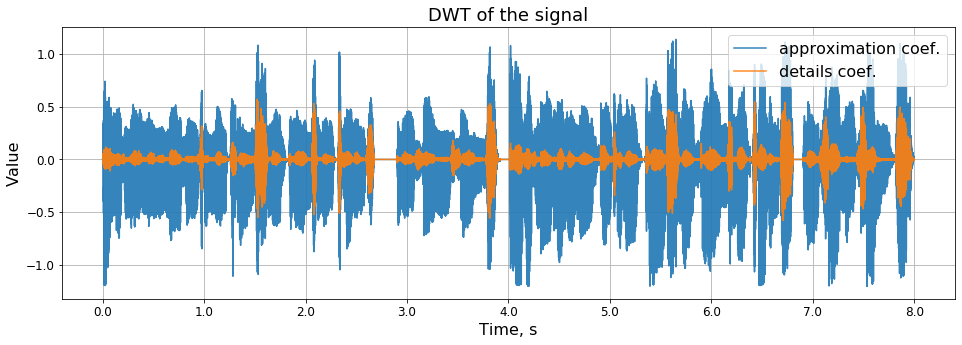

In [10]:
signal_A, signal_D = dwt(signal, 'db1')

fig, ax = plt.subplots(figsize=(16, 5))
ax.plot(signal_A, label='approximation coef.', alpha=0.9)
ax.plot(signal_D, label='details coef.', alpha=0.9)
ax.set_title('DWT of the signal', fontsize=18)
ax.set_xlabel('Time, s', fontsize=16)
ax.set_ylabel('Value', fontsize=16)
ax.set_xticks(x_ticks[:len(x_ticks) // 2 + 1])
ax.set_xticklabels(x_labels[:len(x_ticks) // 2 + 1])
ax.legend(loc='upper right', fontsize=16)
ax.grid()

### Whole audio

Embedding the watermark into the whole signal:

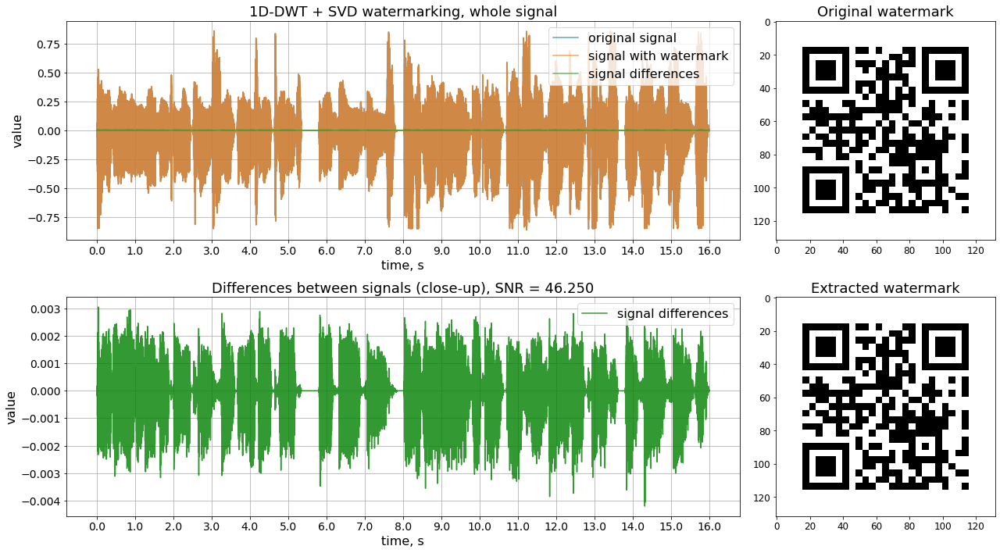

In [11]:
# approximation matrix
signal_A, signal_D = dwt(signal, 'db1')
signal_A_mat = signal_to_2d(signal_A, w_height)

# embedding the watermark into a 2D matrix of the transform
signal_A_mat_w, wp_data = watermark_single(signal_A_mat, model=svd_wat, k=k)

# getting 1D approximation coef.
signal_A_w = signal_to_1d(signal_A_mat_w, crop_length=signal_len // 2)

# inverse DWT
signal_w = idwt(signal_A_w, signal_D, 'db1')

# extracting the watermark
extracted_watermark = extract_from_single(signal_A_mat_w, svd_wat, wp_data, k=k)

# plotting
plot_signals(signal, signal_w, watermark, extracted_watermark,
             main_title='1D-DWT + SVD watermarking, whole signal',
             x_ticks=x_ticks, x_labels=x_labels)

A bit better than without the transform, but not a great improvement.

### Watermarking frames

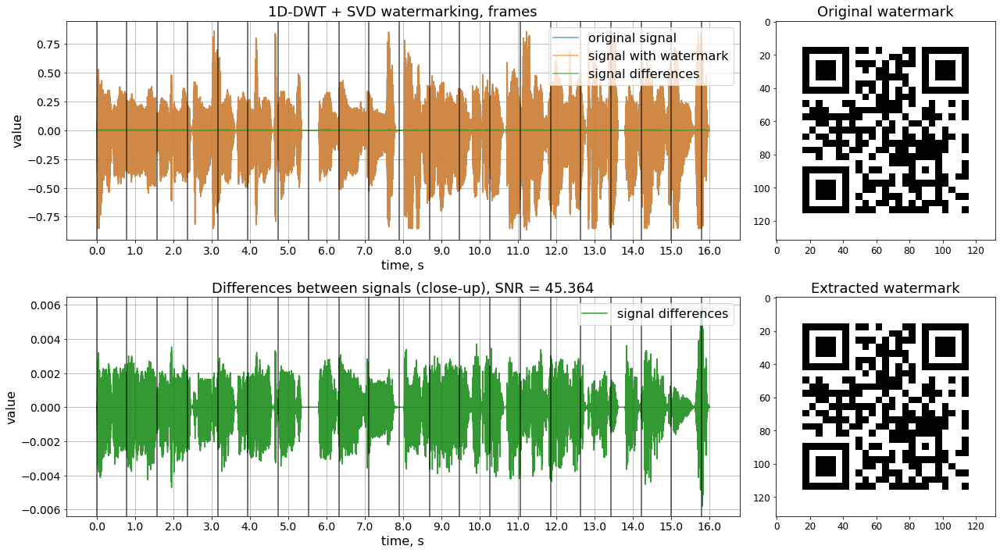

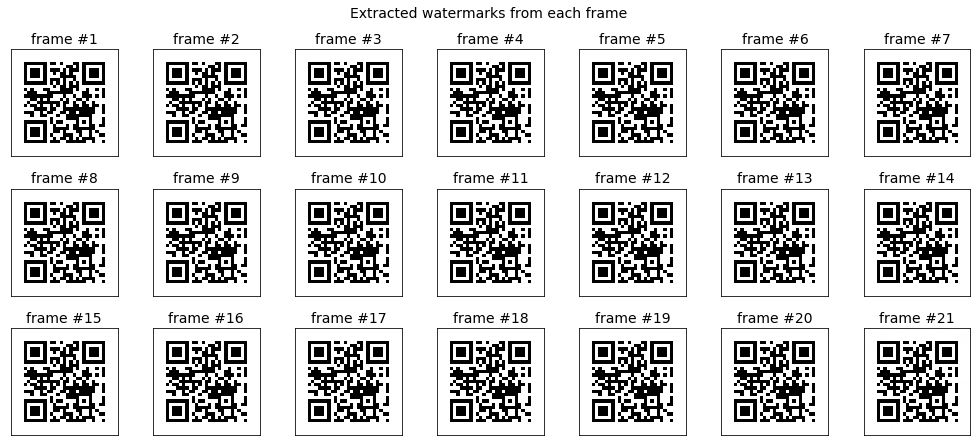

In [12]:
frames_A = split_into_frames(signal_A_mat, w_width)
frame_borders = np.arange(0, signal_len + 1, 2 * w_height * w_width)

# embedding the watermark into a 2D matrix
frames_A_w, wp_data = watermark_many(frames_A, model=svd_wat, k=k)

# getting 1D signal by combining and trasforming frames
signal_A_mat_w = combine_frames(frames_A_w)
signal_A_w = signal_to_1d(signal_A_mat_w, crop_length=signal_len // 2)

# inverse DWT
signal_w = idwt(signal_A_w, signal_D, 'db1')

# extracting the watermark
signal_A_mat_w = signal_to_2d(signal_A_w, w_height)
frames_A_w = split_into_frames(signal_A_mat_w, w_width)
extracted_watermarks = extract_from_many(frames_A_w, svd_wat, wp_data, k=k)

# plotting
plot_signals(signal, signal_w, watermark, extracted_watermarks[0],
             main_title='1D-DWT + SVD watermarking, frames', frame_borders=frame_borders,
             x_ticks=x_ticks, x_labels=x_labels)

# plottign all extracted watermarks
plot_watermarks(extracted_watermarks, rows=3, cols=7, figsize=(14, 6),
                names=[f'frame #{i+1}' for i in range(len(frames))] + [''],
                title='Extracted watermarks from each frame')

## DWT of 2D signal

Another approach is applying DWT (Haar transform) on the 2D matrix representation of the signal and embedding the watermark into the approximation coefficients.

### 2D Discrete Wavelet Transform (DWT)

2D-DWT tranforms the signal into four coefficient matrices: approximation coefficient, and horizontal, vertical and diagonal details. The watermark can be embedded into the approximation part.

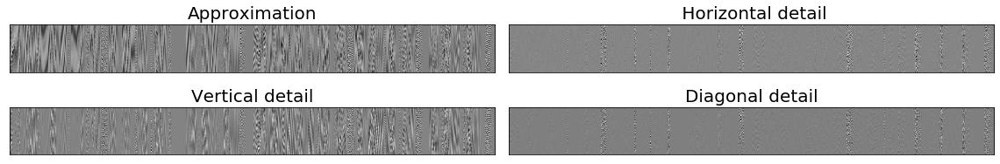

In [13]:
signal_mat = signal_to_2d(signal, w_height * 2)

# Wavelet transform of image, and plot approximation and details
titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
LL, (LH, HL, HH) = dwt2(signal_mat, 'db1')

fig = plt.figure(figsize=(16, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(2, 2, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=20)
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.show()

### One 2D-DWT on the whole audio

Appyting 2D-DWT on the 2D signal matrix and embedding the watermark into the approximation part:

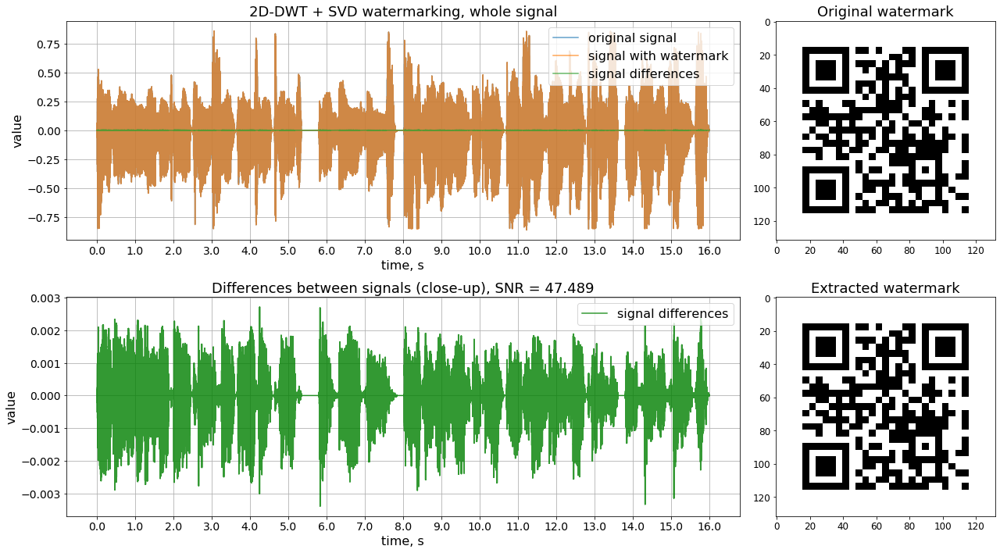

In [14]:
# 2D-DWT
signal_mat = signal_to_2d(signal, w_height * 2)
LL, (LH, HL, HH) = dwt2(signal_mat, 'db1')

# embedding the watermark into a 2D matrix of the transform
LL_w, wp_data = watermark_single(LL, model=svd_wat, k=k)

# inverse 2D-DWT
signal_mat_w = idwt2((LL_w, (LH, HL, HH)), 'db1')

# transforming into 1D signal
signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)


# extracting the watermark
signal_mat_w = signal_to_2d(signal_w, w_height * 2)
LL, (LH, HL, HH) = dwt2(signal_mat_w, 'db1')

extracted_watermark = extract_from_single(LL_w, svd_wat, wp_data, k=k)

# plotting
plot_signals(signal, signal_w, watermark, extracted_watermark,
             main_title='2D-DWT + SVD watermarking, whole signal',
             x_ticks=x_ticks, x_labels=x_labels)

Higher SNR! We can also do the transform twice as suggested in reference [papers](https://link.springer.com/article/10.1007/s11042-019-7214-3):

### Two 2D-DWT on the whole audio

Appyting 2D-DWT twice and comparing the results.

*Note*: padding the signal with zeros so that `width` component is divisible by 4.

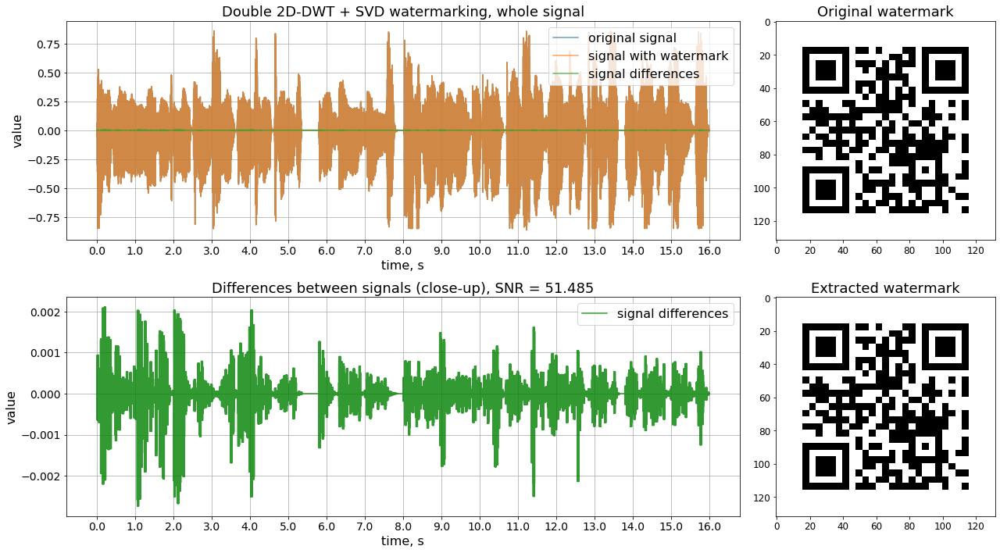

In [15]:
signal_mat = signal_to_2d(signal, w_height * 4)
if signal_mat.shape[1] % 4 > 0:
    signal_mat = np.pad(signal_mat, ((0, 0), (0, 4 - signal_mat.shape[1] % 4)))

# 2D-DWT
LL1, (LH1, HL1, HH1) = dwt2(signal_mat, 'db1')
LL2, (LH2, HL2, HH2) = dwt2(LL1, 'db1')

# embedding the watermark into a 2D matrix of the transform
LL2_w, wp_data = watermark_single(LL2, model=svd_wat, k=k)

# inverse 2D-DWT
LL1_w = idwt2((LL2_w, (LH2, HL2, HH2)), 'db1')
signal_mat_w = idwt2((LL1_w, (LH1, HL1, HH1)), 'db1')

# transforming into 1D signal
signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)


# extracting the watermark
signal_mat_w = signal_to_2d(signal_w, w_height * 4)
if signal_mat_w.shape[1] % 4 > 0:
    signal_mat_w = np.pad(signal_mat, ((0, 0), (0, 4 - signal_mat_w.shape[1] % 4)))

LL1, (LH1, HL1, HH1) = dwt2(signal_mat_w, 'db1')
LL2, (LH2, HL2, HH2) = dwt2(LL1, 'db1')

extracted_watermark = extract_from_single(LL2_w, svd_wat, wp_data, k=k)

# plotting
plot_signals(signal, signal_w, watermark, extracted_watermark,
             main_title='Double 2D-DWT + SVD watermarking, whole signal',
             x_ticks=x_ticks, x_labels=x_labels)

Much lower differences and better SNR!

## DFT of 1D signal

The last transform we are considering is Discrete Fourier Transform (DFT). It can also be defined for 1D and 2D signals. Let's consider the original audio at first.

DFT transforms the signal from the time domain into the complex domain of frequencies. The watermark can be embedded either to the real or imaginary part (amplitude and phase) of frequencies. We are considering only the real part (amplitude) as watermarking embedding using real part showed better results in the SNR metric in one the reference [papers](https://www.researchgate.net/publication/225606177_An_efficient_singular_value_decomposition_algorithm_for_digital_audio_watermarking).

We use FFT (Fast Fourier Transform) implementation to compute DFT.

### 1D DFT

Real and imaginary parts (amplitude and phase) of the DFT over the original signal are:

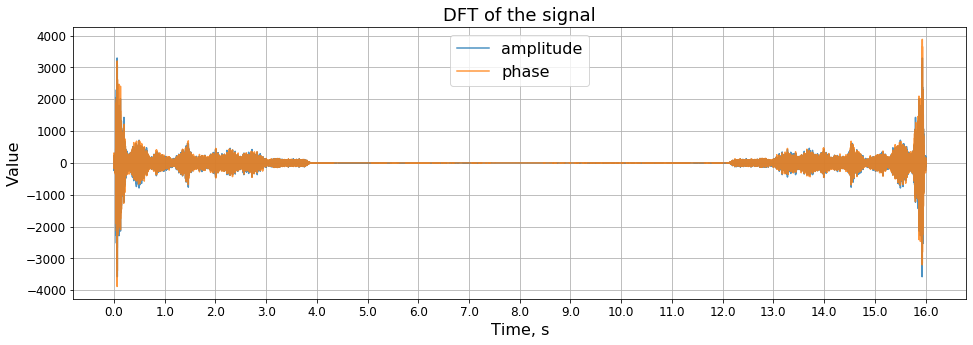

In [16]:
signal_freq = fft(signal)
signal_ampl, signal_phase = signal_freq.real, signal_freq.imag

fig, ax = plt.subplots(figsize=(16, 5))
ax.plot(signal_ampl, label='amplitude', alpha=0.8)
ax.plot(signal_phase, label='phase', alpha=0.8)
ax.set_title('DFT of the signal', fontsize=18)
ax.set_xlabel('Time, s', fontsize=16)
ax.set_ylabel('Value', fontsize=16)
ax.set_xticks(x_ticks)
ax.set_xticklabels(x_labels)
ax.legend(loc='upper center', fontsize=16)
ax.grid()

The magnitudes of the values are not in the range `[-1, 1]`, so SVs are a order larger than SVs of the watermark. SV scaling may hurt the quality of the embeddings. Let's compare both approaches.

### Whole audio with SV scaling

Embedding the watermark into the whole signal wit:

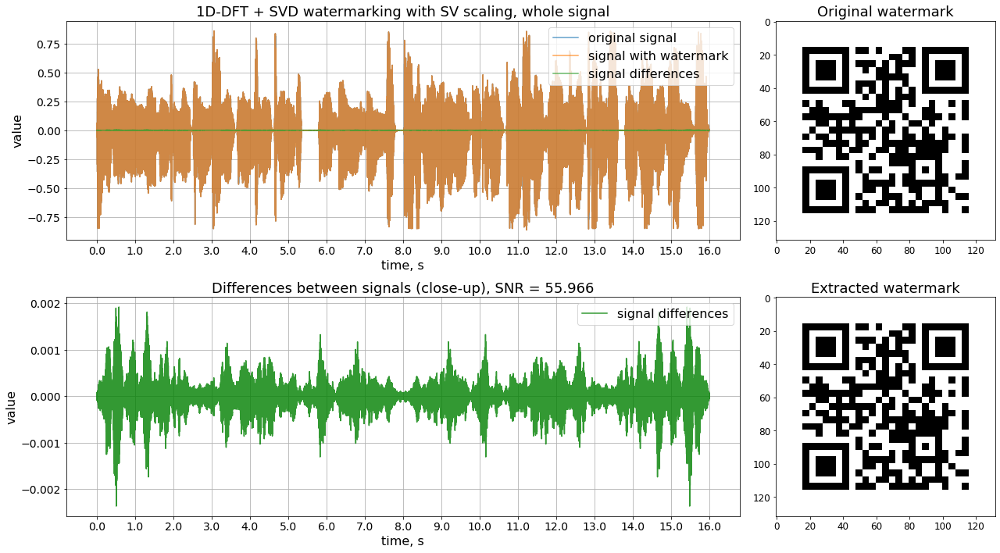

In [17]:
signal_freq = fft(signal)
signal_ampl, signal_phase = signal_freq.real, signal_freq.imag

# amplitude matrix
signal_ampl_mat = signal_to_2d(signal_ampl, w_height)

# embedding the watermark into a 2D matrix of the transform
signal_ampl_mat_w, wp_data = watermark_single(signal_ampl_mat, model=svd_wat, k=k)

# getting 1D amplitude
signal_ampl_w = signal_to_1d(signal_ampl_mat_w, crop_length=signal_len)

# inverse DFT
signal_w = ifft(signal_ampl_w + 1j * signal_phase).real

# extracting the watermark
extracted_watermark = extract_from_single(signal_ampl_mat_w, svd_wat, wp_data, k=k)

# plotting
plot_signals(signal, signal_w, watermark, extracted_watermark,
             main_title='1D-DFT + SVD watermarking with SV scaling, whole signal',
             x_ticks=x_ticks, x_labels=x_labels)

Better than 1D DWT and 2D DWT. What if we do not scale SVs?

### Whole audio without SV scaling

Embedding the watermark into the whole signal wit:

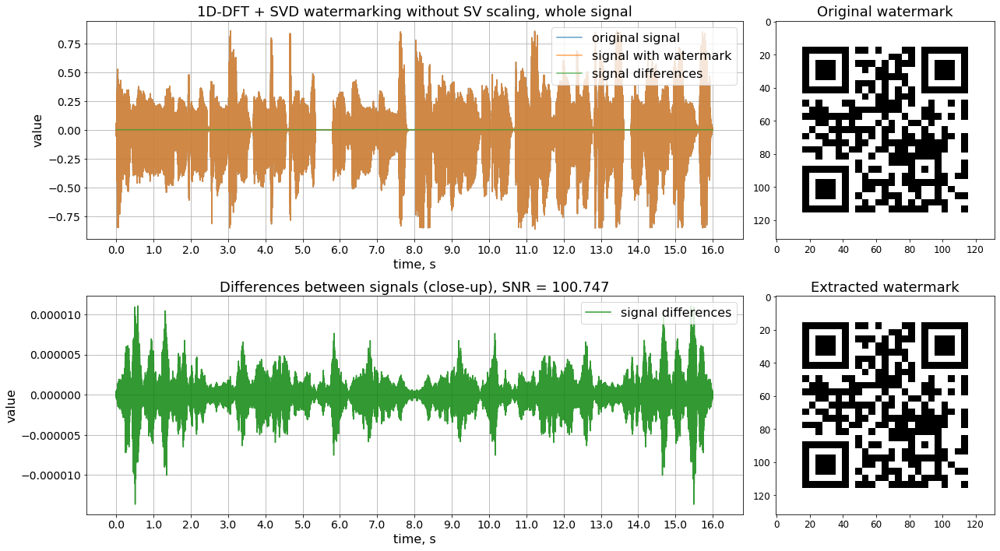

In [18]:
signal_freq = fft(signal)
signal_ampl, signal_phase = signal_freq.real, signal_freq.imag

# amplitude matrix
signal_ampl_mat = signal_to_2d(signal_ampl, w_height)

# embedding the watermark into a 2D matrix of the transform
signal_ampl_mat_w, wp_data = watermark_single(signal_ampl_mat, model=svd_wat_nosc, k=k)

# getting 1D amplitude
signal_ampl_w = signal_to_1d(signal_ampl_mat_w, crop_length=signal_len)

# inverse DFT
signal_w = ifft(signal_ampl_w + 1j * signal_phase).real

# extracting the watermark
extracted_watermark = extract_from_single(signal_ampl_mat_w, svd_wat, wp_data, k=k)

# plotting
plot_signals(signal, signal_w, watermark, extracted_watermark,
             main_title='1D-DFT + SVD watermarking without SV scaling, whole signal',
             x_ticks=x_ticks, x_labels=x_labels)

Several times better. SNR ratio is the best one. However, SNR does not indicate the robustness against attacks. The further experiments will conduct a sufficient evaluation to prove or disprove the robustness of DFT without SV scaling. This approach should be less robust to signal modifications due to small watermark embeddings.

## DFT of 2D signal

Applying DFT over the 2D representation of the signal.

### 2D DFT

2D-DWT tranforms the signal into four coefficient matrices: approximation coefficient, and horizontal, vertical and diagonal details. The watermark can be embedded into the approximation part.

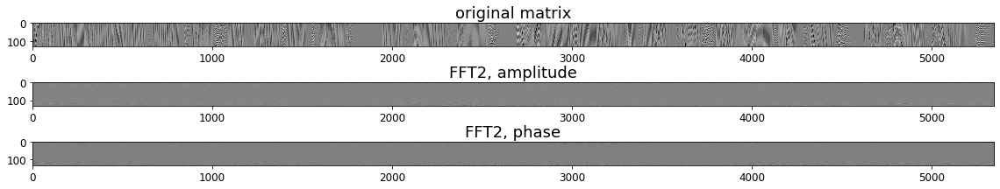

In [19]:
signal_mat = signal_to_2d(signal, w_height)

signal_mat_freq = fft2(signal_mat)
signal_mat_ampl, signal_mat_phase = signal_mat_freq.real, signal_mat_freq.imag

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(16, 3))
ax1.imshow(signal_mat, cmap='gray')
ax2.imshow(signal_mat_ampl, cmap='gray')
ax3.imshow(signal_mat_phase, cmap='gray')
ax1.set_title('original matrix', fontsize=18)
ax2.set_title('FFT2, amplitude', fontsize=18)
ax3.set_title('FFT2, phase', fontsize=18)
fig.tight_layout()
plt.show()

### 2D-DFT on the whole audio

Appyting 2D-DFT on the 2D signal matrix and embedding the watermark into the real valued part:

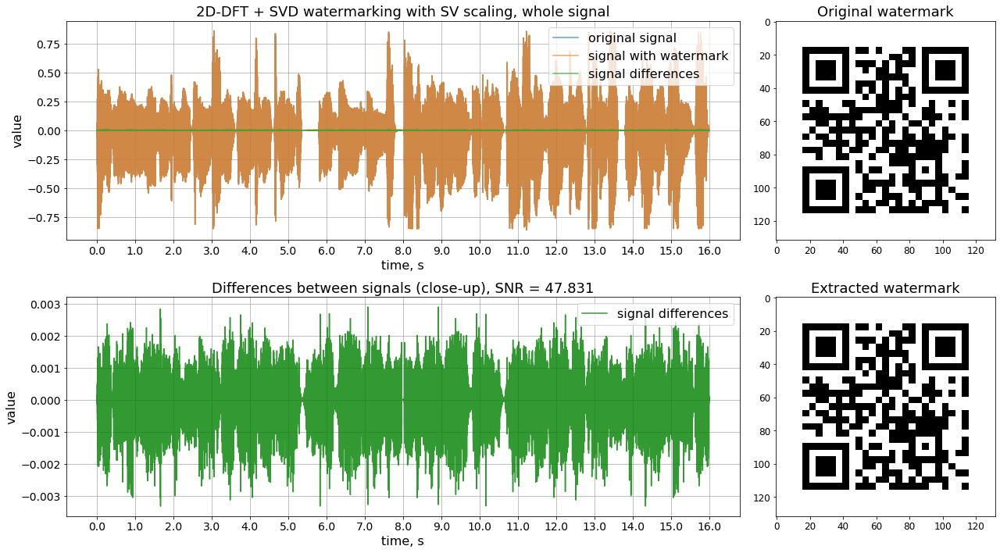

In [20]:
# 2D-DFT
signal_mat = signal_to_2d(signal, w_height)

signal_mat_freq = fft2(signal_mat)
signal_mat_ampl, signal_mat_phase = signal_mat_freq.real, signal_mat_freq.imag

# embedding the watermark into a 2D matrix of the transform
signal_mat_ampl_w, wp_data = watermark_single(signal_mat_ampl, model=svd_wat, k=k)

# inverse 2D-DFT
signal_mat_w = ifft2(signal_mat_ampl_w + 1j * signal_mat_phase).real

# transforming into 1D signal
signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)

# extracting the watermark
extracted_watermark = extract_from_single(signal_mat_ampl_w, svd_wat, wp_data, k=k)

# plotting
plot_signals(signal, signal_w, watermark, extracted_watermark,
             main_title='2D-DFT + SVD watermarking with SV scaling, whole signal',
             x_ticks=x_ticks, x_labels=x_labels)

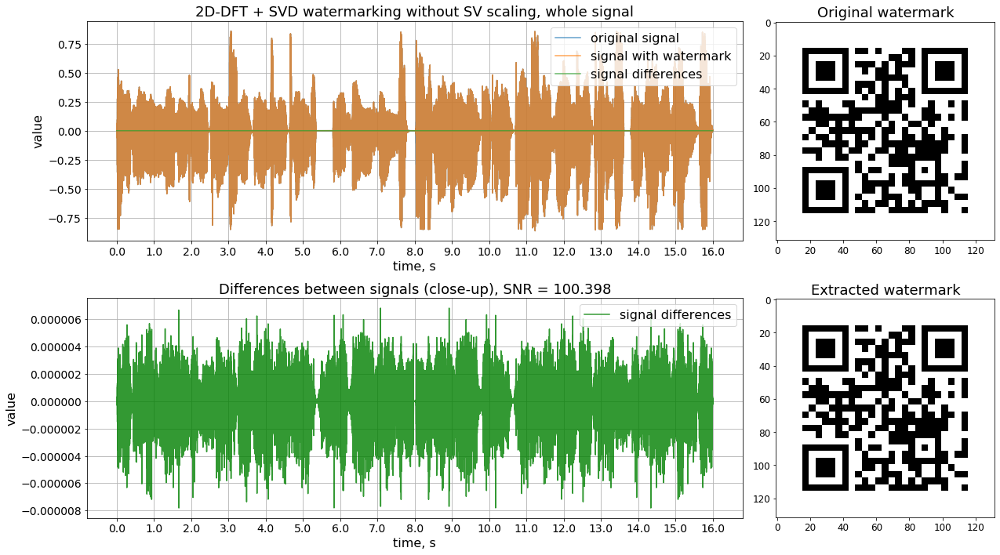

In [21]:
# 2D-DFT
signal_mat = signal_to_2d(signal, w_height)

signal_mat_freq = fft2(signal_mat)
signal_mat_ampl, signal_mat_phase = signal_mat_freq.real, signal_mat_freq.imag

# embedding the watermark into a 2D matrix of the transform
signal_mat_ampl_w, wp_data = watermark_single(signal_mat_ampl, model=svd_wat_nosc, k=k)

# inverse 2D-DFT
signal_mat_w = ifft2(signal_mat_ampl_w + 1j * signal_mat_phase).real

# transforming into 1D signal
signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)

# extracting the watermark
extracted_watermark = extract_from_single(signal_mat_ampl_w, svd_wat, wp_data, k=k)

# plotting
plot_signals(signal, signal_w, watermark, extracted_watermark,
             main_title='2D-DFT + SVD watermarking without SV scaling, whole signal',
             x_ticks=x_ticks, x_labels=x_labels)

Lower SNR. Our explanation: signal is 1D, and extracting frequencies using 1D-DFT is a more natural way.

## Summary

This section introduced SVD-based watermarking and several Discrete Transforms of the signal in time domain.

The Signal-to-noise ratios of the signals with the embedded watermark for each of the approach are:

| Frames | Signal Tranform | SVD-Watermarking | SNR |
| --- | --- | --- | --- |
| whole audio | no | no SV scaling | 41.91 |
| whole audio | no | SV scaling | 44.87 |
| watermark-sized | no | SV scaling | 43.97 |
| whole audio | 1D DWT | SV scaling | 46.25 |
| watermark-sized | 1D DWT | SV scaling | 45.35 |
| whole audio | one 2D DWT | SV scaling | 47.49 |
| whole audio | two 2D DWT | SV scaling | 51.49 |
| whole audio | 1D DFT | SV scaling | 55.97 |
| whole audio | 1D DFT | no SV scaling | 100.75 |
| whole audio | 2D DFT | SV scaling | 47.83 |
| whole audio | 2D DFT | no SV scaling | 100.40 |

The conlusions are:
* SVD-based watermarking without Singular Value scaling may introduce higher noise on the quiet parts of the original audio. Scaling by the maximum values of the SVs of the frame and watermark is important for reducing the resulting noise.
* Wavelet and Fourier transforms improve the quality of the produced watermarked audios. The biased evaluation on one sample shows that 1D DFT is the best in terms of SNR.

*Note*: the tests have shown that SV scaling is needed only when the signal has values in the range from -1 to 1. Otherwise, the values repsented with `np.int16` or `np.int32` are much larger than SV of the watermark and scaling only hurts the performance of the algorithm.

The next section conducts the experiments on the effectiveness and robustness of SVD-based audio watermarking for different values of the watermarking tolerance `k` and attacks on the signal.

# Experiments

The previous section demonstrated SVD-based watermarking and different signal transform approaches on one particular audio. This section conducts as exastive evaluation of the most promissing combination on a set of freely available 8 audios (<=16 s long) downaloaded from [www.looperman.com](https://www.looperman.com) of 4 categories: guitar, piano, ukulele, vocals.

The referene [paper](https://link.springer.com/article/10.1007/s11042-019-7214-3) compared the watermarking on each audio category separately. We observe that the metric values are almost similar for each category, so we just compute the average metrics over all 8 samples.

At first, the watermark tolerance hyperparameter k. Then, each method is checked under a set of attacks described in the corresponding subsection.

* no transform -> 2D signal
* 1D DWT -> 2D signal
* 1D DFT -> 2D signal
* 2D signal -> 2D DWT
* 2D signal -> 2D DFT

## Test samples

In [22]:
names = [
    'guitar1.wav', 'guitar2.wav',
    'piano1.wav', 'piano2.wav',
    'ukulele1.wav', 'ukulele2.wav',
    'vocals1.wav', 'vocals2.wav'
]

files = list(map(lambda x: os.path.join(DATA_DIR, x), names))

rate = 44100
signal_len = 44100 * 16  # 16 seconds

datas, signals = [], []
for file in files:
    _, data = wavfile.read(file)
    data = scale_wav(data)
    
    # padding with zeros or cropping to complete 16 seconds
    pad_size = signal_len - data.shape[0]
    if pad_size > 0:
        data = np.pad(data, ((0, pad_size), (0, 0)))
    data = data[:signal_len, :]
    
    datas.append(data)
    signals.append(data[:, 0])

/Users/ilyaborovik/anaconda/lib/python3.7/site-packages/scipy/io/wavfile.py:273: WavFileWarning: Chunk (non-data) not understood, skipping it.
  WavFileWarning)


Vizualizing the signals:

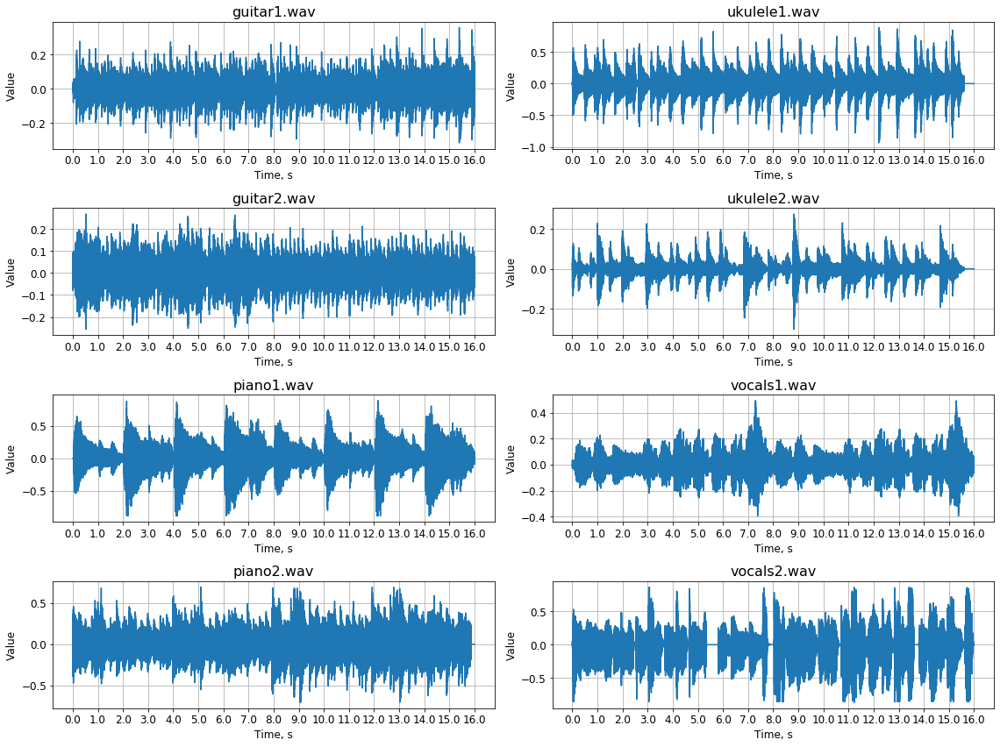

In [23]:
fig, axes = plt.subplots(len(signals) // 2, 2, figsize=(16, 12))

x_ticks = np.arange(0, signal_len + 1, rate)
x_labels = list(map(str, x_ticks / rate))

for i in range(len(signals)):
    ax = axes[i % 4][i // 4]
    ax.plot(signals[i])
    ax.set_title(names[i], fontsize=16)
    ax.set_xlabel('Time, s')
    ax.set_ylabel('Value')
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(x_labels)
    ax.grid()

fig.tight_layout()
plt.show()

## Dependence on the watermark strength `k`

Comparing the values of `k` from 0.01 to 0.1 as in the reference papers.

*Note*: the lower the value of `k`, the less relative watermark information is embedded into the signal. Thus, less noise introduced, but watermarked signal becomes more prone to any attacks with signal modifications.

During this experiment, the watermark is embedded into both the whole signal and divided into frames signal. SNR is used as the evaluation metric.

In [24]:
ks = np.arange(0.01, 0.11, 0.01)
ks

array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ])

### Data collection

In [25]:
frame_width = 4 * w_width
frame_borders = np.arange(0, signal_len + 1, w_height * frame_width)

#### Time + SVD 

In [26]:
snrs_time_svd, snrs_time_svd_nosc, snrs_time_svd_fr = [], [], []

for signal in signals:
    signal_mat = signal_to_2d(signal, w_height)
    frames = split_into_frames(signal_mat, frame_width)
    
    snrs_i, snrs_i_nosc, snrs_i_fr = [], [], []
    for k in ks:
        # whole signal
        signal_mat_w, wp_data = watermark_single(signal_mat, model=svd_wat, k=k)
        signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
        snrs_i.append(snr(signal, signal_w))
        
        signal_mat_w, wp_data = watermark_single(signal_mat, model=svd_wat_nosc, k=k)
        signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
        snrs_i_nosc.append(snr(signal, signal_w))

        # frames
        frames_w, wp_data = watermark_many(frames, model=svd_wat, k=k)
        signal_mat_w = combine_frames(frames_w)
        signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
        snrs_i_fr.append(snr(signal, signal_w))

    snrs_time_svd.append(snrs_i)
    snrs_time_svd_nosc.append(snrs_i_nosc)
    snrs_time_svd_fr.append(snrs_i_fr)

snrs_time_svd = np.array(snrs_time_svd)  
snrs_time_svd_nosc = np.array(snrs_time_svd_nosc)
snrs_time_svd_fr = np.array(snrs_time_svd_fr)
snrs_time_svd.mean(axis=0), snrs_time_svd_nosc.mean(axis=0), snrs_time_svd_fr.mean(axis=0)

(array([44.50925958, 38.48865966, 34.96683448, 32.46805975, 30.52985949,
        28.94623457, 27.60729877, 26.44745984, 25.42440939, 24.50925958]),
 array([36.12507401, 30.1044741 , 26.58264892, 24.08387418, 22.14567392,
        20.562049  , 19.22311321, 18.06327427, 17.04022382, 16.12507401]),
 array([44.2021461 , 38.18154618, 34.659721  , 32.16094627, 30.22274601,
        28.63912109, 27.3001853 , 26.14034636, 25.11729591, 24.2021461 ]))

#### 1D-DWT + SVD 

In [27]:
snrs_dwt_svd, snrs_dwt_svd_fr = [], []
for signal in signals:
    signal_A, signal_D = dwt(signal, 'db1')
    signal_A_mat = signal_to_2d(signal_A, w_height)
    frames_A = split_into_frames(signal_A_mat, frame_width // 2)

    snrs_i, snrs_i_fr = [], []
    for k in ks:
        # whole signal
        signal_A_mat_w, wp_data = watermark_single(signal_A_mat, model=svd_wat, k=k)
        signal_A_w = signal_to_1d(signal_A_mat_w, crop_length=signal_len // 2)
        signal_w = idwt(signal_A_w, signal_D, 'db1')
        snrs_i.append(snr(signal, signal_w))
        
        # frames
        frames_A_w, wp_data = watermark_many(frames_A, model=svd_wat, k=k)
        signal_A_mat_w = combine_frames(frames_A_w)
        signal_A_w = signal_to_1d(signal_A_mat_w, crop_length=signal_len // 2)
        signal_w = idwt(signal_A_w, signal_D, 'db1')
        snrs_i_fr.append(snr(signal, signal_w))
        
    snrs_dwt_svd.append(snrs_i)
    snrs_dwt_svd_fr.append(snrs_i_fr)

snrs_dwt_svd = np.array(snrs_dwt_svd)  
snrs_dwt_svd_fr = np.array(snrs_dwt_svd_fr)
snrs_dwt_svd.mean(axis=0), snrs_dwt_svd_fr.mean(axis=0)

(array([45.79660665, 39.77600673, 36.25418155, 33.75540682, 31.81720656,
        30.23358164, 28.89464585, 27.73480691, 26.71175646, 25.79660665]),
 array([45.12839708, 39.10779716, 35.58597198, 33.08719725, 31.14899699,
        29.56537207, 28.22643628, 27.06659734, 26.04354689, 25.12839708]))

#### Single-2D-DWT + SVD 

In [28]:
snrs_dwt2s_svd, snrs_dwt2s_svd_fr = [], []
for signal in signals:
    signal_mat = signal_to_2d(signal, w_height * 2)
    LL, (LH, HL, HH) = dwt2(signal_mat, 'db1')
    frames_LL = split_into_frames(LL, frame_width // 4)

    snrs_i, snrs_i_fr = [], []
    for k in ks:
        # whole signal
        LL_w, wp_data = watermark_single(LL, model=svd_wat, k=k)
        signal_mat_w = idwt2((LL_w, (LH, HL, HH)), 'db1')
        signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
        snrs_i.append(snr(signal, signal_w))
        
        # frames
        frames_LL_w, wp_data = watermark_many(frames_LL, model=svd_wat, k=k)
        LL_w = combine_frames(frames_LL_w)[:, :LL.shape[1]]
        signal_mat_w = idwt2((LL_w, (LH, HL, HH)), 'db1')
        signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
        snrs_i_fr.append(snr(signal, signal_w))
        
    snrs_dwt2s_svd.append(snrs_i)
    snrs_dwt2s_svd_fr.append(snrs_i_fr)

snrs_dwt2s_svd = np.array(snrs_dwt2s_svd) 
snrs_dwt2s_svd_fr = np.array(snrs_dwt2s_svd_fr)
snrs_dwt2s_svd.mean(axis=0), snrs_dwt2s_svd_fr.mean(axis=0)

(array([47.93646466, 41.91586475, 38.39403957, 35.89526483, 33.95706457,
        32.37343965, 31.03450386, 29.87466492, 28.85161447, 27.93646466]),
 array([46.86865085, 40.84805094, 37.32622576, 34.82745103, 32.88925077,
        31.30562584, 29.96669005, 28.80685111, 27.78380066, 26.86865085]))

#### Double-2D-DWT + SVD 

In [29]:
snrs_dwt2d_svd, snrs_dwt2d_svd_fr = [], []
for signal in signals:
    signal_mat = signal_to_2d(signal, w_height * 4)
    if signal_mat.shape[1] % 4 > 0:
        signal_mat = np.pad(signal_mat, ((0, 0), (0, 4 - signal_mat.shape[1] % 4)))
    LL1, (LH1, HL1, HH1) = dwt2(signal_mat, 'db1')
    LL2, (LH2, HL2, HH2) = dwt2(LL1, 'db1')
    frames_LL2 = split_into_frames(LL2, frame_width // 4)

    snrs_i, snrs_i_fr = [], []
    for k in ks:
        # whole signal
        LL2_w, wp_data = watermark_single(LL2, model=svd_wat, k=k)
        LL1_w = idwt2((LL2_w, (LH2, HL2, HH2)), 'db1')
        signal_mat_w = idwt2((LL1_w, (LH1, HL1, HH1)), 'db1')
        signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
        snrs_i.append(snr(signal, signal_w))
        
        # frames
        frames_LL2_w, wp_data = watermark_many(frames_LL2, model=svd_wat, k=k)
        LL2_w = combine_frames(frames_LL2_w)[:, :LL2.shape[1]]
        LL1_w = idwt2((LL2_w, (LH2, HL2, HH2)), 'db1')
        signal_mat_w = idwt2((LL1_w, (LH1, HL1, HH1)), 'db1')
        signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
        snrs_i_fr.append(snr(signal, signal_w))
        
    snrs_dwt2d_svd.append(snrs_i)
    snrs_dwt2d_svd_fr.append(snrs_i_fr)

snrs_dwt2d_svd = np.array(snrs_dwt2d_svd)  
snrs_dwt2d_svd_fr = np.array(snrs_dwt2d_svd_fr)  
snrs_dwt2d_svd.mean(axis=0), snrs_dwt2d_svd_fr.mean(axis=0)

(array([50.17986333, 44.15926342, 40.63743823, 38.1386635 , 36.20046324,
        34.61683832, 33.27790253, 32.11806359, 31.09501314, 30.17986333]),
 array([49.51278625, 43.49218634, 39.97036115, 37.47158642, 35.53338616,
        33.94976124, 32.61082545, 31.45098651, 30.42793606, 29.51278625]))

#### 1D-DFT + SVD (with and without SV scaling)

In [30]:
snrs_fft_svd, snrs_fft_svd_nosc, snrs_fft_svd_fr = [], [], []

for signal in signals:
    signal_freq = fft(signal)
    signal_ampl, signal_phase = signal_freq.real, signal_freq.imag
    signal_ampl_mat = signal_to_2d(signal_ampl, w_height)
    
    frames = split_into_frames(signal_ampl_mat, frame_width)

    snrs_i, snrs_i_nosc, snrs_i_fr = [], [], []
    for k in ks:
        # whole signal
        signal_ampl_mat_w, wp_data = watermark_single(signal_ampl_mat, model=svd_wat, k=k)
        signal_ampl_w = signal_to_1d(signal_ampl_mat_w, crop_length=signal_len)
        signal_w = ifft(signal_ampl_w + 1j * signal_phase).real
        snrs_i.append(snr(signal, signal_w))
        
        # whole signal – no scaling
        signal_ampl_mat_w, wp_data = watermark_single(signal_ampl_mat, model=svd_wat_nosc, k=k)
        signal_ampl_w = signal_to_1d(signal_ampl_mat_w, crop_length=signal_len)
        signal_w = ifft(signal_ampl_w + 1j * signal_phase).real
        snrs_i_nosc.append(snr(signal, signal_w))
        
        # frames 
        frames_w, wp_data = watermark_many(frames, model=svd_wat, k=k)
        signal_ampl_mat_w = combine_frames(frames_w)
        signal_ampl_w = signal_to_1d(signal_ampl_mat_w, crop_length=signal_len)
        signal_w = ifft(signal_ampl_w + 1j * signal_phase).real
        snrs_i_fr.append(snr(signal, signal_w))
        
    snrs_fft_svd.append(snrs_i)
    snrs_fft_svd_nosc.append(snrs_i_nosc)
    snrs_fft_svd_fr.append(snrs_i_fr)

snrs_fft_svd = np.array(snrs_fft_svd) 
snrs_fft_svd_nosc = np.array(snrs_fft_svd_nosc)
snrs_fft_svd_fr = np.array(snrs_fft_svd_fr)
snrs_fft_svd.mean(axis=0), snrs_fft_svd_nosc.mean(axis=0), snrs_fft_svd_fr.mean(axis=0)

(array([53.4790829 , 47.45848299, 43.93665781, 41.43788308, 39.49968282,
        37.91605789, 36.5771221 , 35.41728316, 34.39423271, 33.4790829 ]),
 array([95.3599151 , 89.33931518, 85.81749   , 83.31871527, 81.38051501,
        79.79689009, 78.4579543 , 77.29811536, 76.27506491, 75.3599151 ]),
 array([50.44051089, 44.41991098, 40.8980858 , 38.39931107, 36.46111081,
        34.87748589, 33.53855009, 32.37871115, 31.3556607 , 30.44051089]))

#### 2D-DFT + SVD (with and without SV scaling)

In [31]:
svd_wat = SVDWatermarking(watermark, scale_svs=True)

snrs_fft2_svd, snrs_fft2_svd_nosc, snrs_fft2_svd_fr = [], [], []
for signal in signals:
    signal_mat = signal_to_2d(signal, w_height)

    signal_mat_freq = fft2(signal_mat)
    signal_mat_ampl, signal_mat_phase = signal_mat_freq.real, signal_mat_freq.imag
    
    frames = split_into_frames(signal_mat_ampl, frame_width)
    
    snrs_i, snrs_i_nosc, snrs_i_fr = [], [], []
    for k in ks:
        # whole signal
        signal_mat_ampl_w, wp_data = watermark_single(signal_mat_ampl, model=svd_wat, k=k)
        signal_mat_w = ifft2(signal_mat_ampl_w + 1j * signal_mat_phase).real
        signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
        snrs_i.append(snr(signal, signal_w))
        
        signal_mat_ampl_w, wp_data = watermark_single(signal_mat_ampl, model=svd_wat_nosc, k=k)
        signal_mat_w = ifft2(signal_mat_ampl_w + 1j * signal_mat_phase).real
        signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
        snrs_i_nosc.append(snr(signal, signal_w))
        
        # frames
        frames_w, wp_data = watermark_many(frames, model=svd_wat, k=k)
        signal_mat_ampl_w = combine_frames(frames_w)[:, :signal_mat_ampl.shape[1]]
        signal_mat = ifft2(signal_mat_ampl_w + 1j * signal_mat_phase).real
        signal_w = signal_to_1d(signal_mat, crop_length=signal_len)
        snrs_i_fr.append(snr(signal, signal_w))
        
    snrs_fft2_svd.append(snrs_i)
    snrs_fft2_svd_nosc.append(snrs_i_nosc)
    snrs_fft2_svd_fr.append(snrs_i_fr)

snrs_fft2_svd = np.array(snrs_fft2_svd)  
snrs_fft2_svd_nosc = np.array(snrs_fft2_svd_nosc)  
snrs_fft2_svd_fr = np.array(snrs_fft2_svd_fr)  
snrs_fft2_svd.mean(axis=0), snrs_fft2_svd_nosc.mean(axis=0), snrs_fft2_svd_fr.mean(axis=0)

(array([47.55413547, 41.53353556, 38.01171038, 35.51293565, 33.57473539,
        31.99111047, 30.65217467, 29.49233573, 28.46928528, 27.55413547]),
 array([94.61116562, 88.59056571, 85.06874052, 82.56996579, 80.63176553,
        79.04814061, 77.70920482, 76.54936588, 75.52631543, 74.61116562]),
 array([45.33752272, 39.31692281, 35.79509763, 33.2963229 , 31.35812264,
        29.77449772, 28.43556192, 27.27572298, 26.25267254, 25.33752272]))

### Plotting

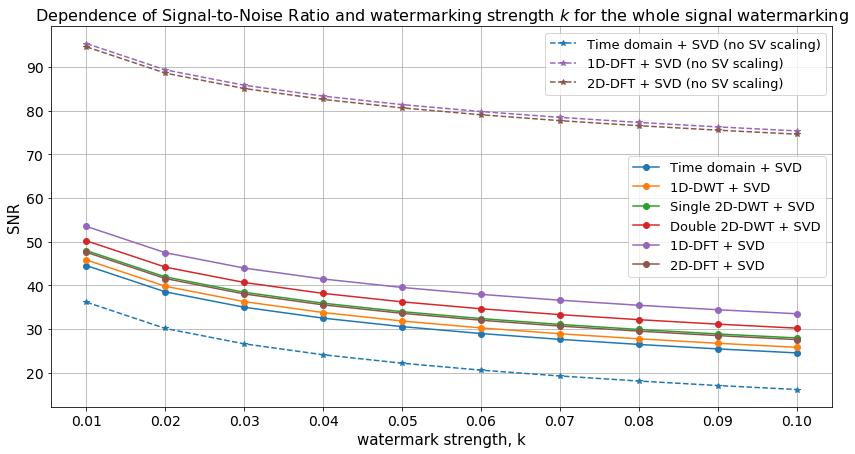

In [32]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
fig, ax = plt.subplots(figsize=(14, 7))

p0, = ax.plot(ks, snrs_time_svd.mean(axis=0),     label='Time domain + SVD', c=colors[0], marker='o')
p1, = ax.plot(ks, snrs_dwt_svd.mean(axis=0),      label='1D-DWT + SVD', c=colors[1], marker='o')
p2, = ax.plot(ks, snrs_dwt2s_svd.mean(axis=0),    label='Single 2D-DWT + SVD', c=colors[2], marker='o')
p3, = ax.plot(ks, snrs_dwt2d_svd.mean(axis=0),    label='Double 2D-DWT + SVD', c=colors[3], marker='o')
p4, = ax.plot(ks, snrs_fft_svd.mean(axis=0),      label='1D-DFT + SVD', c=colors[4], marker='o')
p5, = ax.plot(ks, snrs_fft2_svd.mean(axis=0),     label='2D-DFT + SVD', c=colors[5], marker='o')

p01, = ax.plot(ks, snrs_time_svd_nosc.mean(axis=0),label='Time domain + SVD (no SV scaling)', c=colors[0], marker='*', ls='--')
p41, = ax.plot(ks, snrs_fft_svd_nosc.mean(axis=0), label='1D-DFT + SVD (no SV scaling)', c=colors[4], marker='*', ls='--')
p51, = ax.plot(ks, snrs_fft2_svd_nosc.mean(axis=0),label='2D-DFT + SVD (no SV scaling)', c=colors[5], marker='*', ls='--')

l1 = plt.legend([p0, p1, p2, p3, p4, p5], 
               ['Time domain + SVD', '1D-DWT + SVD', 'Single 2D-DWT + SVD', 
                'Double 2D-DWT + SVD', '1D-DFT + SVD', '2D-DFT + SVD'], loc='right', fontsize=13)
l2 = plt.legend([p01, p41, p51], 
               ['Time domain + SVD (no SV scaling)', '1D-DFT + SVD (no SV scaling)', 
                '2D-DFT + SVD (no SV scaling)'], loc='upper right', fontsize=13)

plt.gca().add_artist(l1)

ax.set_title(r'Dependence of Signal-to-Noise Ratio and watermarking strength $k$ for the whole signal watermarking',
             fontsize=16)
ax.set_xlabel('watermark strength, k', fontsize=15)
ax.set_ylabel('SNR', fontsize=15)
ax.set_xticks(ks)
ax.tick_params(axis='both', which='major', labelsize=14)
ax.grid()
plt.show()

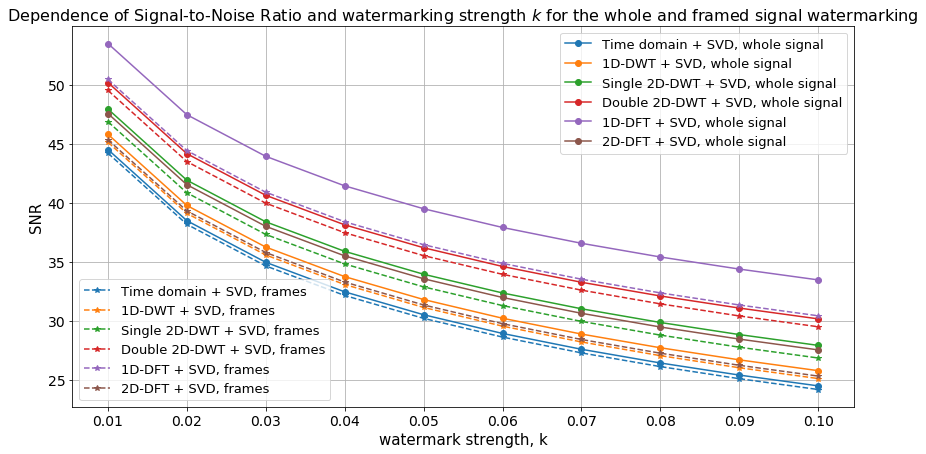

In [33]:
fig, ax = plt.subplots(figsize=(14, 7))

p0, = ax.plot(ks, snrs_time_svd.mean(axis=0),     label='Time domain + SVD, whole signal', c=colors[0], marker='o')
p1, = ax.plot(ks, snrs_dwt_svd.mean(axis=0),      label='1D-DWT + SVD, whole signal', c=colors[1], marker='o')
p2, = ax.plot(ks, snrs_dwt2s_svd.mean(axis=0),    label='Single 2D-DWT + SVD, whole signal', c=colors[2], marker='o')
p3, = ax.plot(ks, snrs_dwt2d_svd.mean(axis=0),    label='Double 2D-DWT + SVD, whole signal', c=colors[3], marker='o')
p4, = ax.plot(ks, snrs_fft_svd.mean(axis=0),      label='1D-DFT + SVD, whole signal', c=colors[4], marker='o')
p5, = ax.plot(ks, snrs_fft2_svd.mean(axis=0),     label='2D-DFT + SVD, whole signal', c=colors[5], marker='o')

p01, = ax.plot(ks, snrs_time_svd_fr.mean(axis=0),     label='Time domain + SVD, frames', c=colors[0], marker='*', ls='--')
p11, = ax.plot(ks, snrs_dwt_svd_fr.mean(axis=0),      label='1D-DWT + SVD, frames', c=colors[1], marker='*', ls='--')
p21, = ax.plot(ks, snrs_dwt2s_svd_fr.mean(axis=0),    label='Single 2D-DWT + SVD, frames', c=colors[2], marker='*', ls='--')
p31, = ax.plot(ks, snrs_dwt2d_svd_fr.mean(axis=0),    label='Double 2D-DWT + SVD, frames', c=colors[3], marker='*', ls='--')
p41, = ax.plot(ks, snrs_fft_svd_fr.mean(axis=0),      label='1D-DFT + SVD, frames', c=colors[4], marker='*', ls='--')
p51, = ax.plot(ks, snrs_fft2_svd_fr.mean(axis=0),     label='2D-DFT + SVD, frames', c=colors[5], marker='*', ls='--')

l1 = plt.legend([p0, p1, p2, p3, p4, p5], 
               ['Time domain + SVD, whole signal', '1D-DWT + SVD, whole signal', 
                'Single 2D-DWT + SVD, whole signal', 'Double 2D-DWT + SVD, whole signal', 
                '1D-DFT + SVD, whole signal', '2D-DFT + SVD, whole signal'], loc='upper right', fontsize=13)
l2 = plt.legend([p01, p11, p21, p31, p41, p51], 
               ['Time domain + SVD, frames', '1D-DWT + SVD, frames', 
                'Single 2D-DWT + SVD, frames', 'Double 2D-DWT + SVD, frames', 
                '1D-DFT + SVD, frames', '2D-DFT + SVD, frames'], loc='lower left', fontsize=13)

plt.gca().add_artist(l1)

ax.set_title(r'Dependence of Signal-to-Noise Ratio and watermarking strength $k$ for the whole and framed signal watermarking',
             fontsize=16)
ax.set_xlabel('watermark strength, k', fontsize=15)
ax.set_ylabel('SNR', fontsize=15)
ax.set_xticks(ks)
ax.tick_params(axis='both', which='major', labelsize=14)
ax.grid()
plt.show()

This experiment shows that 1D Discrete Fourier Transform is the best option for the audio watermarking based on the noise, introduced after the watermarking. 

Double application of 2D DWT again overperforms one application of DWT.

For $k < 0.1$, each presented approach passes the minimum required deviation of 20 dB (minimum IFPI requirement [[source]](https://ieeexplore.ieee.org/document/1406154) for the audio watermarking to be almost non-noticable).

In general, the computed dependence correlates with the results in the reference [paper](https://www.researchgate.net/publication/225606177_An_efficient_singular_value_decomposition_algorithm_for_digital_audio_watermarking) for all methods except for the Fourier Transform. The authors report the SNR values of more than 80 for DFT. We cannot say the reasons why got lower values. We used different evaluation datasets (they used only one audio) but for all other methods the SNR values are of a comparable scale.

We've done with the noise ratio estimation and watermarked audios sound almost without external noise. But are these approaches robust? Can we extract the watermark after a slight modification (attack) of the signal with the copyright information?

The next subsection conducts a series of experiments to answer these questions.

## Adversarial attacks

Among the tested approaches, we are selecting the the most promising ones together with no-transform baseline:
* Time domain + SVD
* (Double) 2D-DWT + SVD
* 1D-DFT + SVD
* 1D-DFT + SVD (no SV scaling)

The following attacks are applied on the watermarked signals:
* Noise attacks
* Signal scaling attacks
* Cropping attacks

The extracted watermark and original watermark are compared using Normalizer Correlation coefficient:

The demonstration is done for the first signal using both whole- and frame-based emdeddings.

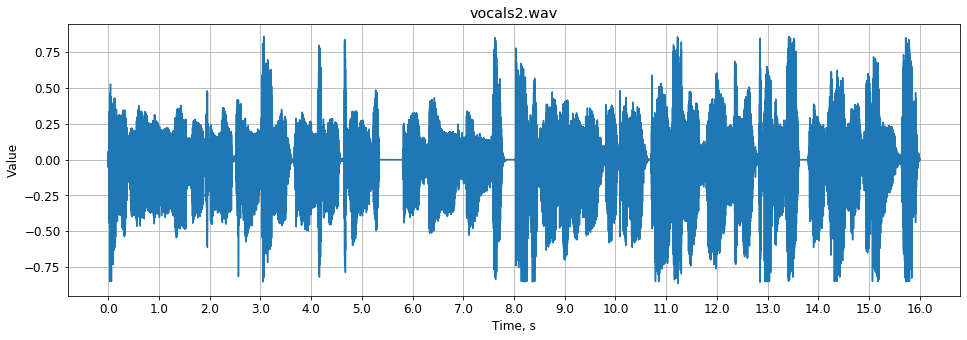

In [34]:
k = 0.01

signal = signals[-1]
fig, ax = plt.subplots(figsize=(16, 5))
ax.plot(signal)
ax.set_title(names[-1])
ax.set_xlabel('Time, s')
ax.set_ylabel('Value')
ax.set_xticks(x_ticks)
ax.set_xticklabels(x_labels)
ax.grid()
plt.show()

### Noise attacks – whole signal

In [35]:
np.random.seed(23)
noise_0db = np.zeros(signal.shape)
noise_5db = 0.0015 * np.random.randn(*signal.shape)
noise_10db = 0.003 * np.random.randn(*signal.shape)
noise_20db = 0.01 * np.random.randn(*signal.shape)
noise_30db = 0.03 * np.random.randn(*signal.shape)

noises = [noise_5db, noise_10db, noise_20db, noise_30db]
noise_names = ['5 dB', '10 dB', '20 dB', '30 dB']

def watermark_to_range(watermark, v_min=0., v_max=1.):
    watermark[watermark < 0] = 0
    watermark[watermark > 1] = 1
    return watermark

#### Time-domain

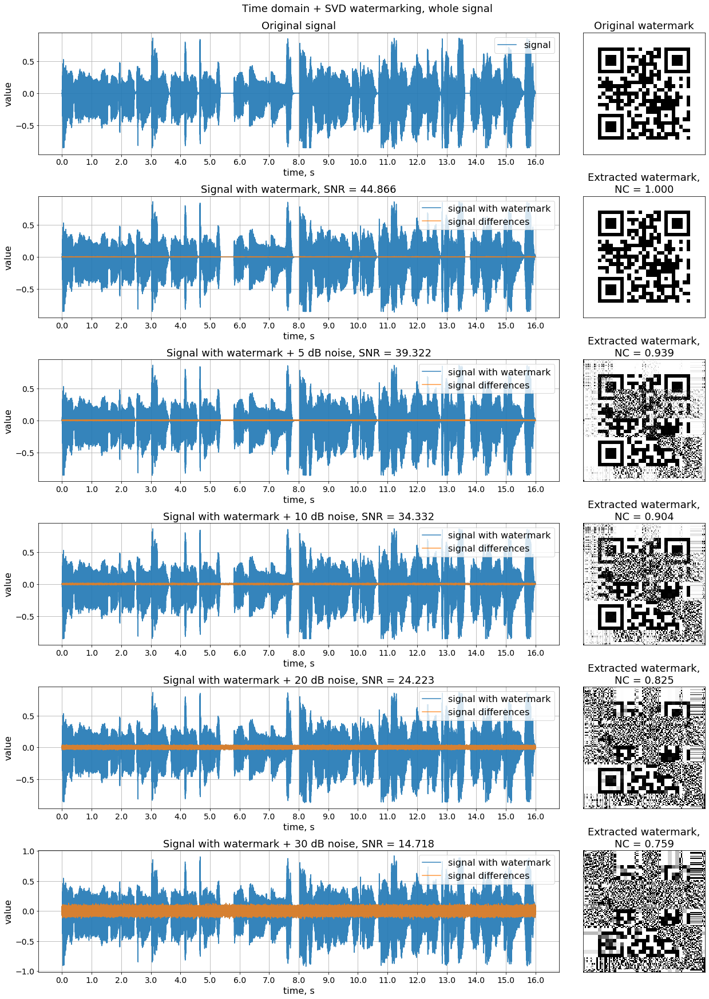

In [36]:
global_title = 'Time domain + SVD watermarking, whole signal'

# embedding the watermark
signal_mat = signal_to_2d(signal, w_height)
signal_mat_w, wp_data = watermark_single(signal_mat, model=svd_wat, k=k)
signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)

# extracting the watermark
signal_mat_w = signal_to_2d(signal_w, w_height)
extr_watermark = extract_from_single(signal_mat_w, svd_wat, wp_data, k=k)
extr_watermark = watermark_to_range(extr_watermark)

noise_signals_td = [signal, signal_w]
noise_waterm_td = [watermark, extr_watermark]
noise_titles_td = ['Original signal', 'Signal with watermark']

# adding the noise
for noise, name in zip(noises, noise_names):
    signal_wn = signal_w + noise
    signal_mat_w = signal_to_2d(signal_wn, w_height)
    extr_watermark = extract_from_single(signal_mat_w, svd_wat, wp_data, k=k)
    extr_watermark = watermark_to_range(extr_watermark)
    
    noise_signals_td.append(signal_wn)
    noise_waterm_td.append(extr_watermark)
    noise_titles_td.append(f'Signal with watermark + {name} noise')

# plotting
plot_signal_attacks(noise_signals_td, noise_waterm_td, noise_titles_td, 
                    figsize=(18, 24), global_title=global_title,
                    x_ticks=x_ticks, x_labels=x_labels)

#### 2D-DWT

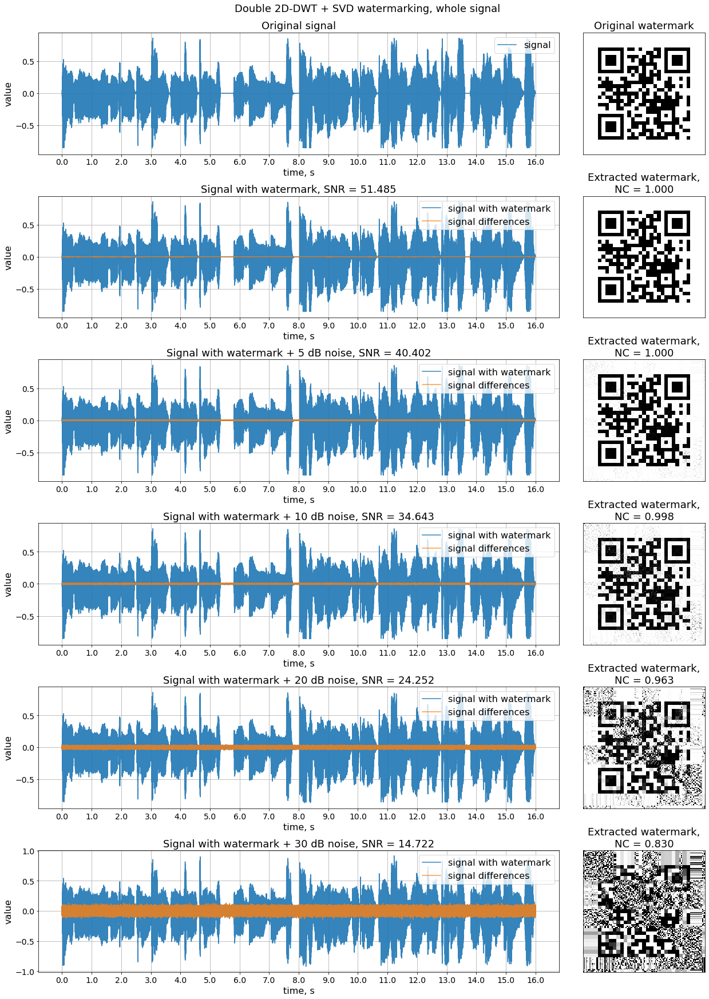

In [37]:
global_title = 'Double 2D-DWT + SVD watermarking, whole signal'

def dwt2_embed(signal):
    # embedding the watermark
    signal_mat = signal_to_2d(signal, w_height * 4)
    if signal_mat.shape[1] > 0:
        signal_mat = np.pad(signal_mat, ((0, 0), (0, 4 - signal_mat.shape[1] % 4)))

    # 2D-DWT
    LL1, (LH1, HL1, HH1) = dwt2(signal_mat, 'db1')
    LL2, (LH2, HL2, HH2) = dwt2(LL1, 'db1')
    LL2_w, wp_data = watermark_single(LL2, model=svd_wat, k=k)
    # inverse 2D-DWT
    LL1_w = idwt2((LL2_w, (LH2, HL2, HH2)), 'db1')
    signal_mat_w = idwt2((LL1_w, (LH1, HL1, HH1)), 'db1')
    signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
    
    return signal_w, wp_data

def dwt2_extract(signal_w, wp_data):
    # extracting the watermark
    signal_mat_w = signal_to_2d(signal_w, w_height * 4)
    LL1, (LH1, HL1, HH1) = dwt2(signal_mat_w, 'db1')
    LL2_w, (LH2, HL2, HH2) = dwt2(LL1, 'db1')
    
    return extract_from_single(LL2_w, svd_wat, wp_data, k=k)

signal_w, wp_data = dwt2_embed(signal)
extr_watermark = dwt2_extract(signal_w, wp_data)
extr_watermark = watermark_to_range(extr_watermark)

noise_signals_dwt2 = [signal, signal_w]
noise_waterm_dwt2 = [watermark, extr_watermark]
noise_titles_dwt2 = ['Original signal', 'Signal with watermark']

# adding the noise
for noise, name in zip(noises, noise_names):
    signal_wn = signal_w + noise
    extr_watermark = dwt2_extract(signal_wn, wp_data)
    extr_watermark = watermark_to_range(extr_watermark)
    
    noise_signals_dwt2.append(signal_wn)
    noise_waterm_dwt2.append(extr_watermark)
    noise_titles_dwt2.append(f'Signal with watermark + {name} noise')

# plotting
plot_signal_attacks(noise_signals_dwt2, noise_waterm_dwt2, noise_titles_dwt2, 
                    figsize=(18, 24), global_title=global_title,
                    x_ticks=x_ticks, x_labels=x_labels)

#### 1D-DFT

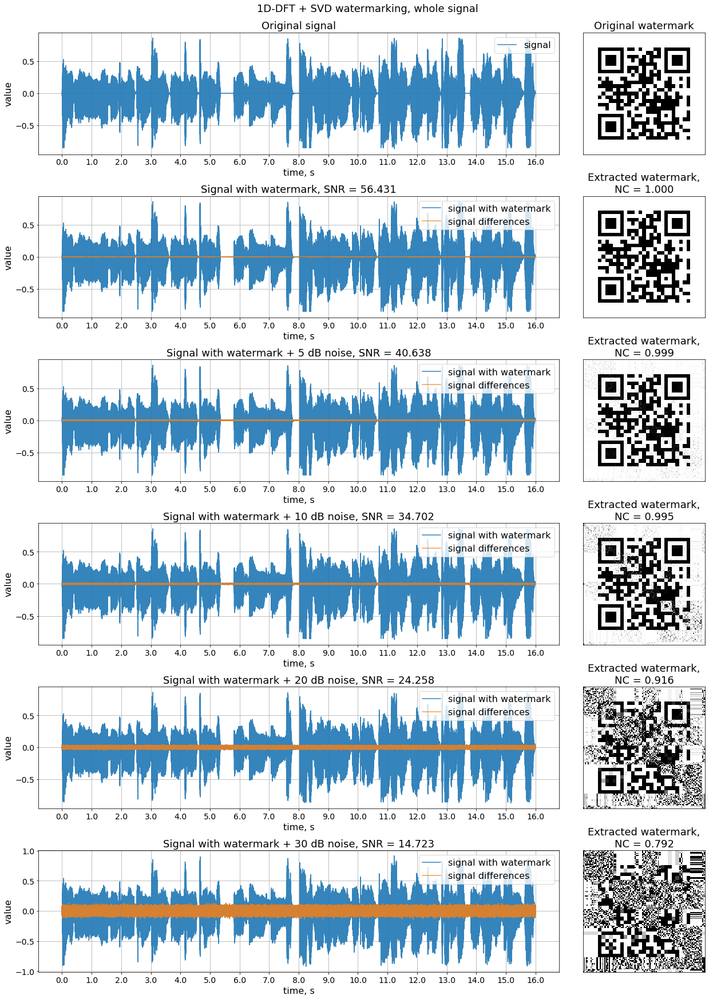

In [38]:
global_title = '1D-DFT + SVD watermarking, whole signal'

def dft_embed(signal):
    # embedding the watermark
    signal_freq = fft(signal)
    signal_ampl, signal_phase = signal_freq.real, signal_freq.imag
    signal_ampl_mat = signal_to_2d(signal_ampl, w_height)
    # embedding the watermark into a 2D matrix of the transform
    signal_ampl_mat_w, wp_data = watermark_single(signal_ampl_mat, model=svd_wat, k=k)
    signal_ampl_w = signal_to_1d(signal_ampl_mat_w, crop_length=signal_len)
    # inverse DFT
    signal_w = ifft(signal_ampl_w + 1j * signal_phase)
    
    return signal_w, wp_data

def dft_extract(signal_w, wp_data):
    # signal_w += np.random.rand.(*signal_w.shape)
    signal_freq = fft(signal_w)
    signal_ampl, signal_phase = signal_freq.real, signal_freq.imag
    signal_ampl_mat_w = signal_to_2d(signal_ampl, w_height)
    
    return extract_from_single(signal_ampl_mat_w, svd_wat, wp_data, k=k)

signal_w, wp_data = dft_embed(signal)
extr_watermark = dft_extract(signal_w, wp_data)
extr_watermark = watermark_to_range(extr_watermark)

noise_signals_dft = [signal, signal_w.real]
noise_waterm_dft = [watermark, extr_watermark]
noise_titles_dft = ['Original signal', 'Signal with watermark']

# adding the noise
for noise, name in zip(noises, noise_names):
    signal_wn = signal_w + noise
    extr_watermark = dft_extract(signal_wn, wp_data)
    extr_watermark = watermark_to_range(extr_watermark)
    
    noise_signals_dft.append(signal_wn.real)
    noise_waterm_dft.append(extr_watermark)
    noise_titles_dft.append(f'Signal with watermark + {name} noise')

# plotting
plot_signal_attacks(noise_signals_dft, noise_waterm_dft, noise_titles_dft, 
                    figsize=(18, 24), global_title=global_title,
                    x_ticks=x_ticks, x_labels=x_labels)

#### 1D-DFT (no SV scaling)

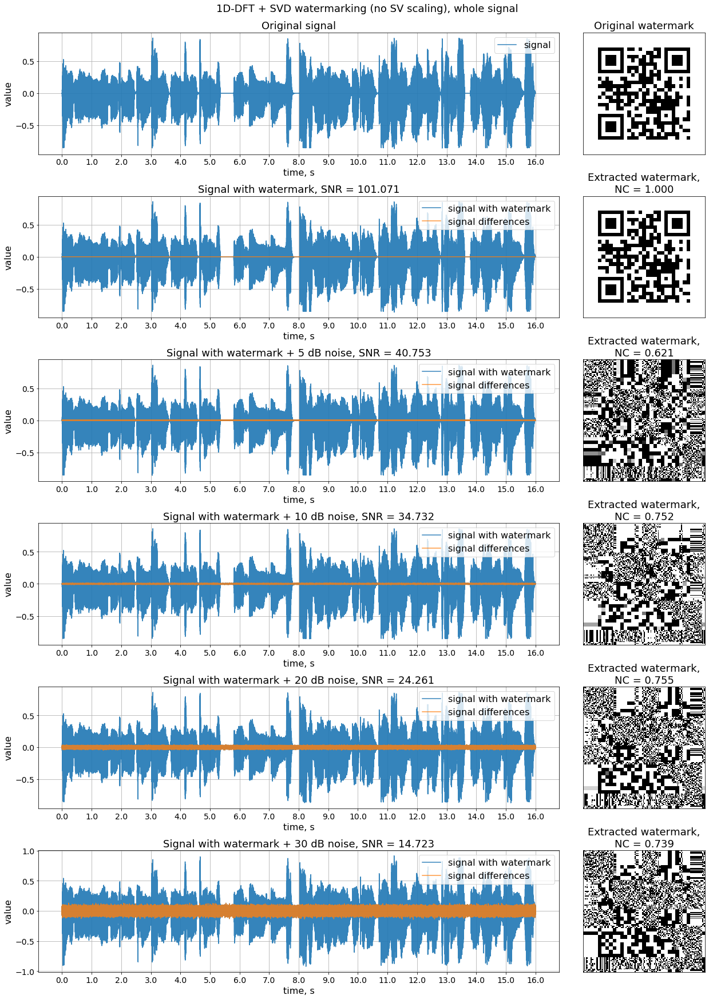

In [39]:
global_title = '1D-DFT + SVD watermarking (no SV scaling), whole signal'

def dft_embed(signal):
    # embedding the watermark
    signal_freq = fft(signal)
    signal_ampl, signal_phase = signal_freq.real, signal_freq.imag
    signal_ampl_mat = signal_to_2d(signal_ampl, w_height)
    # embedding the watermark into a 2D matrix of the transform
    signal_ampl_mat_w, wp_data = watermark_single(signal_ampl_mat, model=svd_wat_nosc, k=k)
    signal_ampl_w = signal_to_1d(signal_ampl_mat_w, crop_length=signal_len)
    # inverse DFT
    signal_w = ifft(signal_ampl_w + 1j * signal_phase)
    
    return signal_w, wp_data

def dft_extract(signal_w, wp_data):
    # signal_w += np.random.rand.(*signal_w.shape)
    signal_freq = fft(signal_w)
    signal_ampl, signal_phase = signal_freq.real, signal_freq.imag
    signal_ampl_mat_w = signal_to_2d(signal_ampl, w_height)
    
    return extract_from_single(signal_ampl_mat_w, svd_wat_nosc, wp_data, k=k)

signal_w, wp_data = dft_embed(signal)
extr_watermark = dft_extract(signal_w, wp_data)
extr_watermark = watermark_to_range(extr_watermark)

noise_signals_dft_nosc = [signal, signal_w.real]
noise_waterm_dft_nosc = [watermark, extr_watermark]
noise_titles_dft_nosc = ['Original signal', 'Signal with watermark']

# adding the noise
for noise, name in zip(noises, noise_names):
    signal_wn = signal_w + noise
    extr_watermark = dft_extract(signal_wn, wp_data)
    extr_watermark = watermark_to_range(extr_watermark)
    
    noise_signals_dft_nosc.append(signal_wn.real)
    noise_waterm_dft_nosc.append(extr_watermark)
    noise_titles_dft_nosc.append(f'Signal with watermark + {name} noise')

# plotting
plot_signal_attacks(noise_signals_dft_nosc, noise_waterm_dft_nosc, noise_titles_dft_nosc, 
                    figsize=(18, 24), global_title=global_title,
                    x_ticks=x_ticks, x_labels=x_labels)

### Noise attacks – framed embeddings

Let's see if we can retrive more information when embed watermarks into frames.

The best extracted watermark according to correlation is used in the evaluaiton.

#### Time-domain

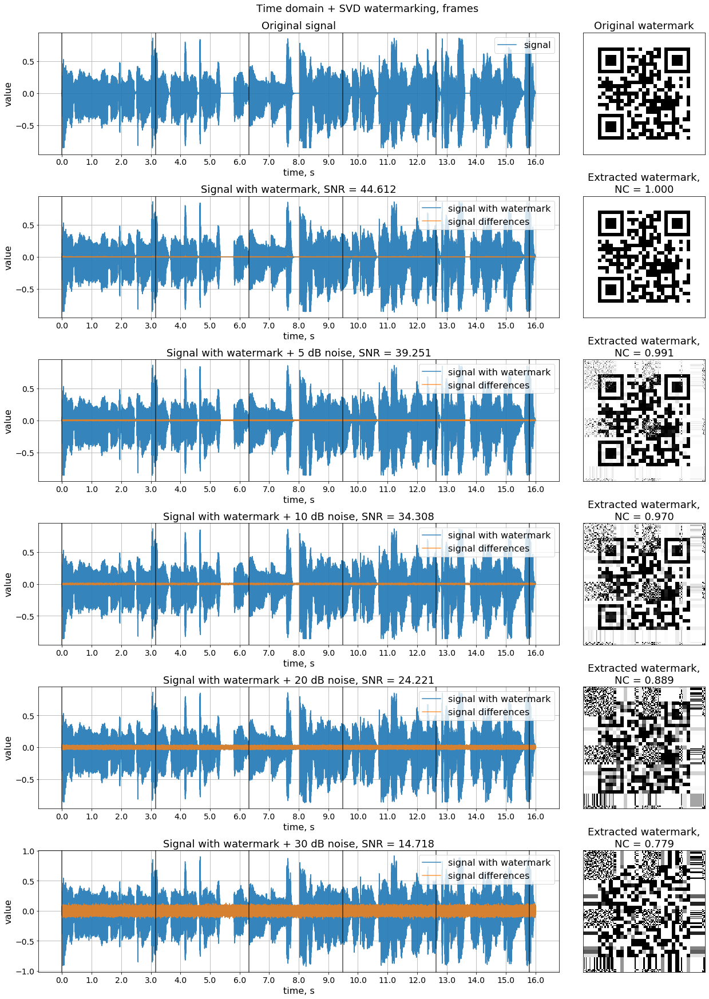

In [40]:
frame_width = 4 * w_width
global_title = 'Time domain + SVD watermarking, frames'
frame_borders = np.arange(0, signal_len + 1, 2 * w_height * frame_width)

# embedding the watermark
signal_mat = signal_to_2d(signal, w_height)
frames = split_into_frames(signal_mat, frame_width)
frames_w, wp_data = watermark_many(frames, model=svd_wat, k=k)
signal_mat_w = combine_frames(frames_w)
signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)

# extracting the watermark
signal_mat_w = signal_to_2d(signal_w, w_height)
frames_w = split_into_frames(signal_mat_w, frame_width)
extr_watermarks = extract_from_many(frames_w, svd_wat, wp_data, k=k)
extr_watermarks = [watermark_to_range(w) for w in extr_watermarks]

ncs = np.array([nc(watermark, w) for w in extr_watermarks])

noise_signals_td_fr = [signal, signal_w]
noise_waterm_td_fr = [watermark, extr_watermarks[np.argmax(ncs)]]
noise_titles_td_fr = ['Original signal', 'Signal with watermark']

# adding the noise
for noise, name in zip(noises, noise_names):
    signal_wn = signal_w + noise
    
    signal_mat_w = signal_to_2d(signal_wn, w_height)
    frames_w = split_into_frames(signal_mat_w, frame_width)
    extr_watermarks = extract_from_many(frames_w, svd_wat, wp_data, k=k)
    extr_watermarks = [watermark_to_range(w) for w in extr_watermarks]
    
    ncs = np.array([nc(watermark, w) for w in extr_watermarks])
    
    noise_signals_td_fr.append(signal_wn)
    noise_waterm_td_fr.append(extr_watermarks[np.argmax(ncs)])
    noise_titles_td_fr.append(f'Signal with watermark + {name} noise')

# plotting
plot_signal_attacks(noise_signals_td_fr, noise_waterm_td_fr, noise_titles_td_fr, 
                    figsize=(18, 24), global_title=global_title, 
                    x_ticks=x_ticks, x_labels=x_labels, frame_borders=frame_borders)

#### 2D-DWT

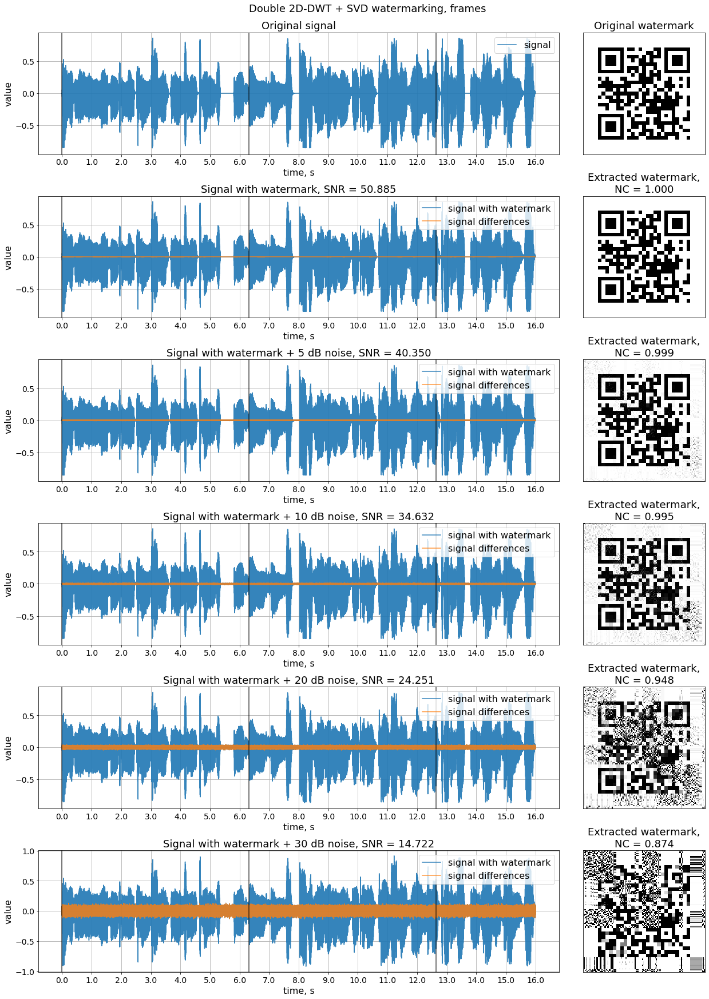

In [41]:
global_title = 'Double 2D-DWT + SVD watermarking, frames'
frame_borders = np.arange(0, signal_len + 1, 4 * w_height * frame_width)

def dwt2_embed(signal):
    # embedding the watermark
    signal_mat = signal_to_2d(signal, w_height * 4)
    if signal_mat.shape[1] > 0:
        signal_mat = np.pad(signal_mat, ((0, 0), (0, 4 - signal_mat.shape[1] % 4)))

    # 2D-DWT
    LL1, (LH1, HL1, HH1) = dwt2(signal_mat, 'db1')
    LL2, (LH2, HL2, HH2) = dwt2(LL1, 'db1')
    
    frames = split_into_frames(LL2, frame_width // 4)
    frames_w, wp_data = watermark_many(frames, model=svd_wat, k=k)
    LL2_w = combine_frames(frames_w)[:, :LL2.shape[1]]
    
    # inverse 2D-DWT
    LL1_w = idwt2((LL2_w, (LH2, HL2, HH2)), 'db1')
    signal_mat_w = idwt2((LL1_w, (LH1, HL1, HH1)), 'db1')
    
    signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
    
    return signal_w, wp_data

def dwt2_extract(signal_w, wp_data):
    # extracting the watermark
    signal_mat_w = signal_to_2d(signal_w, w_height * 4)
    if signal_mat_w.shape[1] > 0:
        signal_mat_w = np.pad(signal_mat_w, ((0, 0), (0, 4 - signal_mat_w.shape[1] % 4)))
    LL1, (LH1, HL1, HH1) = dwt2(signal_mat_w, 'db1')
    LL2_w, (LH2, HL2, HH2) = dwt2(LL1, 'db1')
    frames_w = split_into_frames(LL2_w, frame_width // 4)
    
    return extract_from_many(frames_w, svd_wat, wp_data, k=k)

signal_w, wp_data = dwt2_embed(signal)
extr_watermarks = dwt2_extract(signal_w, wp_data)
extr_watermarks = [watermark_to_range(w) for w in extr_watermarks]
ncs = np.array([nc(watermark, w) for w in extr_watermarks])

noise_signals_dwt2_fr = [signal, signal_w]
noise_waterm_dwt2_fr = [watermark, extr_watermarks[np.argmax(ncs)]]
noise_titles_dwt2_fr = ['Original signal', 'Signal with watermark']

# adding the noise
for noise, name in zip(noises, noise_names):
    signal_wn = signal_w + noise
    extr_watermarks = dwt2_extract(signal_wn, wp_data)
    extr_watermarks = [watermark_to_range(w) for w in extr_watermarks]
    ncs = np.array([nc(watermark, w) for w in extr_watermarks])
    
    noise_signals_dwt2_fr.append(signal_wn)
    noise_waterm_dwt2_fr.append(extr_watermarks[np.argmax(ncs)])
    noise_titles_dwt2_fr.append(f'Signal with watermark + {name} noise')

# plotting
plot_signal_attacks(noise_signals_dwt2_fr, noise_waterm_dwt2_fr, noise_titles_dwt2_fr, 
                    figsize=(18, 24), global_title=global_title,
                    x_ticks=x_ticks, x_labels=x_labels, frame_borders=frame_borders)

#### 1D-DFT

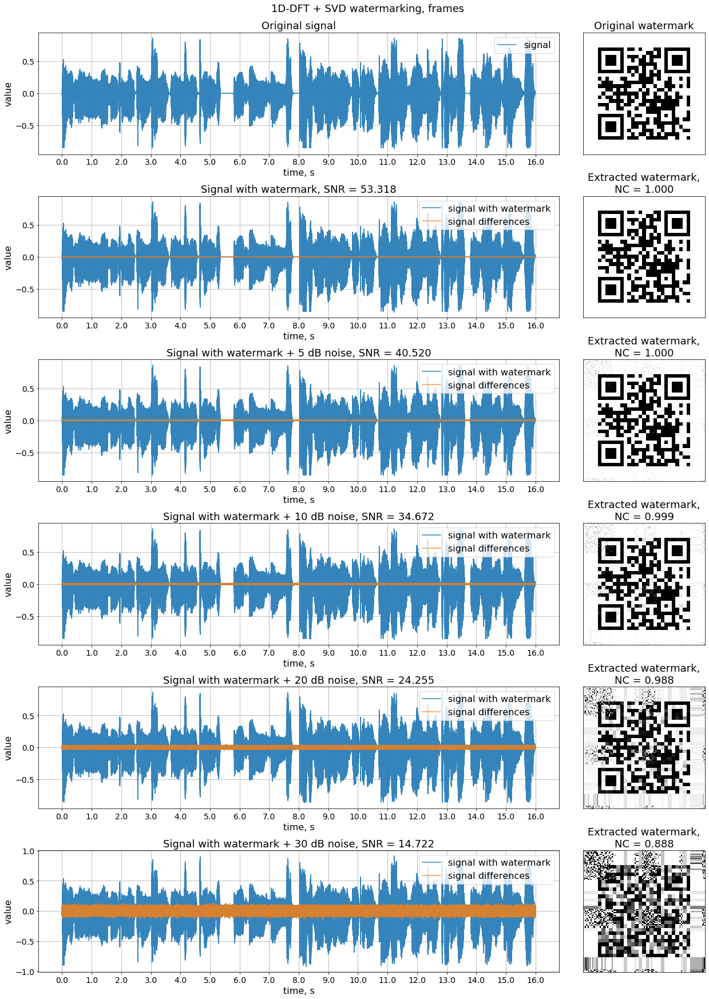

In [42]:
global_title = '1D-DFT + SVD watermarking, frames'
frame_borders = np.arange(0, signal_len + 1, 2 * w_height * frame_width)

def dft_embed(signal):
    # embedding the watermark
    signal_freq = fft(signal)
    signal_ampl, signal_phase = signal_freq.real, signal_freq.imag
    signal_ampl_mat = signal_to_2d(signal_ampl, w_height)
    
    frames = split_into_frames(signal_ampl_mat, frame_width)
    frames_w, wp_data = watermark_many(frames, model=svd_wat, k=k)
    signal_ampl_mat_w = combine_frames(frames_w)
    
    # embedding the watermark into a 2D matrix of the transform
    signal_ampl_w = signal_to_1d(signal_ampl_mat_w, crop_length=signal_len)
    # inverse DFT
    signal_w = ifft(signal_ampl_w + 1j * signal_phase)
    
    return signal_w, wp_data

def dft_extract(signal_w, wp_data):
    # signal_w += np.random.rand.(*signal_w.shape)
    signal_freq = fft(signal_w)
    signal_ampl, signal_phase = signal_freq.real, signal_freq.imag
    signal_ampl_mat_w = signal_to_2d(signal_ampl, w_height)
    frames_w = split_into_frames(signal_ampl_mat_w, frame_width)
    
    return extract_from_many(frames_w, svd_wat, wp_data, k=k)

signal_w, wp_data = dft_embed(signal)
extr_watermarks = dft_extract(signal_w, wp_data)
extr_watermarks = [watermark_to_range(w) for w in extr_watermarks]
ncs = np.array([nc(watermark, w) for w in extr_watermarks])

noise_signals_dft_fr = [signal, signal_w.real]
noise_waterm_dft_fr = [watermark, extr_watermarks[np.argmax(ncs)]]
noise_titles_dft_fr = ['Original signal', 'Signal with watermark']

# adding the noise
for noise, name in zip(noises, noise_names):
    signal_wn = signal_w + noise
    extr_watermarks = dft_extract(signal_wn, wp_data)
    extr_watermarks = [watermark_to_range(w) for w in extr_watermarks]
    ncs = np.array([nc(watermark, w) for w in extr_watermarks])
    
    noise_signals_dft_fr.append(signal_wn.real)
    noise_waterm_dft_fr.append(extr_watermarks[np.argmax(ncs)])
    noise_titles_dft_fr.append(f'Signal with watermark + {name} noise')

# plotting
plot_signal_attacks(noise_signals_dft_fr, noise_waterm_dft_fr, noise_titles_dft_fr, 
                    figsize=(18, 24), global_title=global_title,
                    x_ticks=x_ticks, x_labels=x_labels, )

### Noise attacks summary

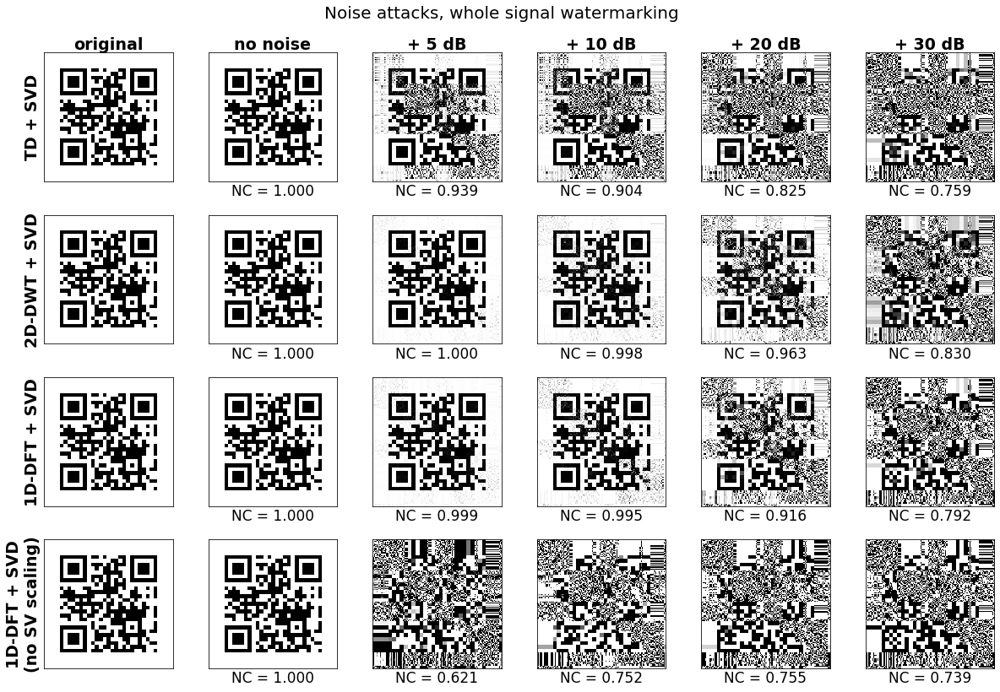

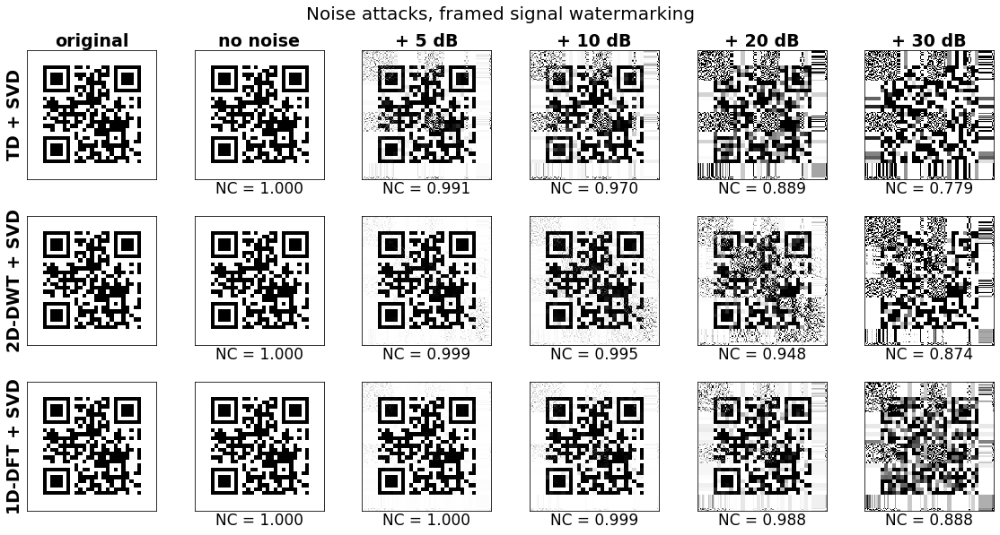

In [43]:
methods = ['TD + SVD', '2D-DWT + SVD', '1D-DFT + SVD', '1D-DFT + SVD\n(no SV scaling)']
noise_sum_names = ['original', 'no noise'] \
    + list(map(lambda x: '+ ' + x, noise_names))
title = 'Noise attacks, whole signal watermarking'

plot_watermarks_comp([noise_waterm_td, noise_waterm_dwt2, noise_waterm_dft, noise_waterm_dft_nosc], 
                rows=len(methods), cols=len(noise_sum_names), figsize=(17, 11),
                title=title, column_names=noise_sum_names, row_names=methods)

methods = methods[:-1]
title = 'Noise attacks, framed signal watermarking'

plot_watermarks_comp([noise_waterm_td_fr, noise_waterm_dwt2_fr, noise_waterm_dft_fr], 
                rows=len(methods), cols=len(noise_sum_names), figsize=(16, 8),
                title=title, column_names=noise_sum_names, row_names=methods)

### Scaling and cropping attacks – whole signal

In [44]:
np.random.seed(23)

truth_arr = np.zeros(signal_len, dtype=bool)
mask_all = truth_arr.copy()
mask_12 = truth_arr.copy()
mask_12[signal_len // 2:] = True
mask_34 = truth_arr.copy()
mask_34[3 * signal_len // 4:] = True
mask_rnd_34 = truth_arr.copy()
mask_rnd_34[np.random.binomial(1, 0.25, (signal_len, )).astype(bool)] = True

masks = [mask_12, mask_34, mask_rnd_34, mask_all, mask_all, mask_all]
scaling = [1., 1., 1., 1.2, 0.8, 0.5]
attack_names = ['crop 50%', 'crop 25%', 'crop 25% (random)', 'scale by 1.2', 'scale by 0.8', 'scale by 0.5']

#### Time-domain

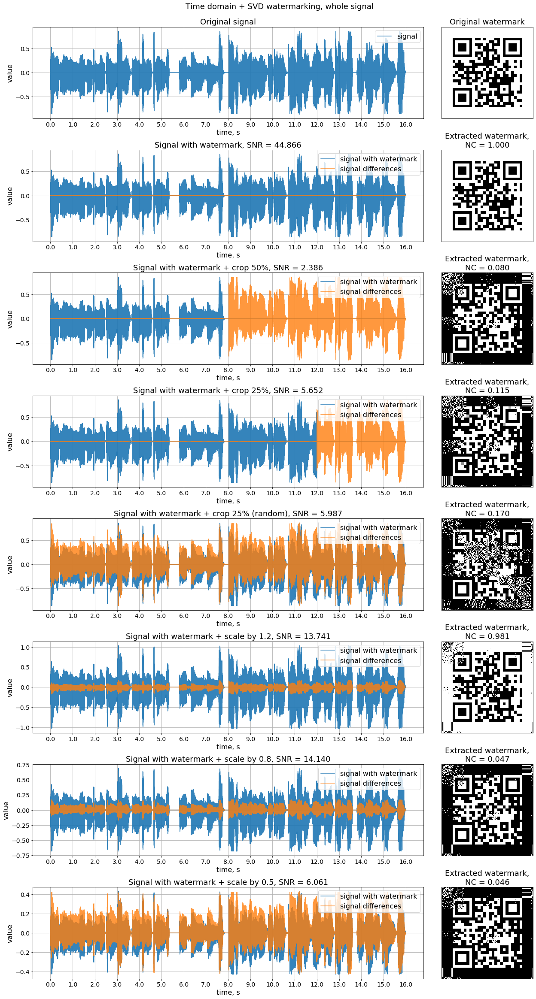

In [45]:
global_title = 'Time domain + SVD watermarking, whole signal'

# embedding the watermark
signal_mat = signal_to_2d(signal, w_height)
signal_mat_w, wp_data = watermark_single(signal_mat, model=svd_wat, k=k)
signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)

# extracting the watermark
signal_mat_w = signal_to_2d(signal_w, w_height)
extr_watermark = extract_from_single(signal_mat_w, svd_wat, wp_data, k=k)
extr_watermark = watermark_to_range(extr_watermark)

attck_signals_td = [signal, signal_w]
attck_waterm_td = [watermark, extr_watermark]
attck_titles_td = ['Original signal', 'Signal with watermark']

# attack
for mask, scale, name in zip(masks, scaling, attack_names):
    signal_wn = scale * signal_w
    signal_wn[mask] = 0.
    
    signal_mat_w = signal_to_2d(signal_wn, w_height)
    extr_watermark = extract_from_single(signal_mat_w, svd_wat, wp_data, k=k)
    extr_watermark = watermark_to_range(extr_watermark)
    
    attck_signals_td.append(signal_wn)
    attck_waterm_td.append(extr_watermark)
    attck_titles_td.append(f'Signal with watermark + {name}')

# plotting
plot_signal_attacks(attck_signals_td, attck_waterm_td, attck_titles_td, 
                    figsize=(18, 32), global_title=global_title,
                    x_ticks=x_ticks, x_labels=x_labels)

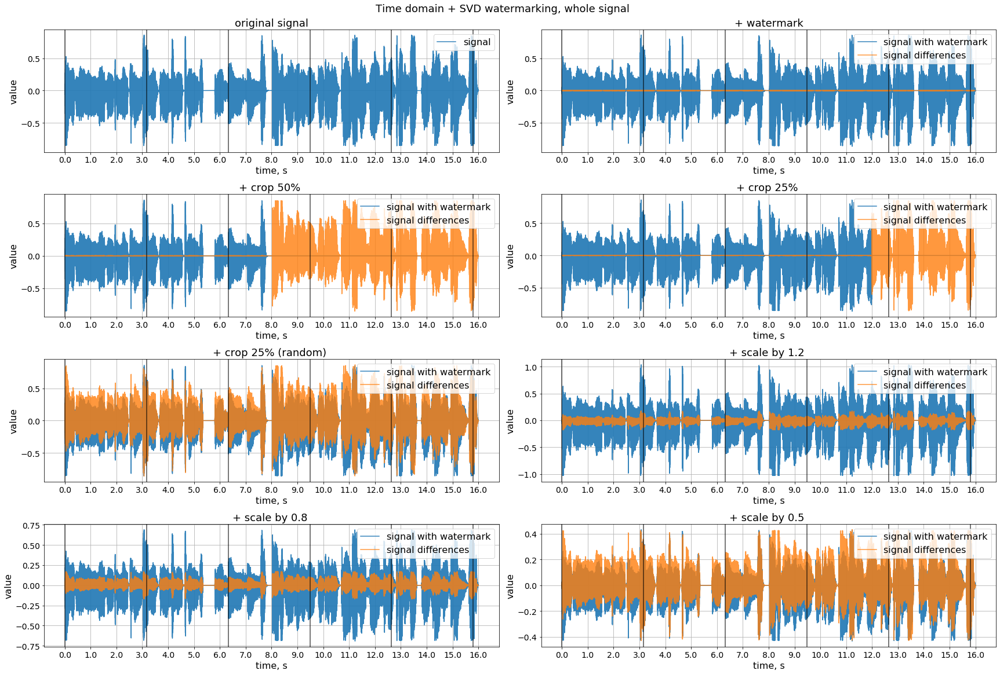

In [46]:
def plot_noises(signals):
    titles = ['original signal', '+ watermark'] + [f'+ {name} ' for name in attack_names]

    fig, axes = plt.subplots(len(signals) // 2, 2, figsize=(24, 16))
    fig.suptitle(global_title, fontsize=18, y=1.01)

    def _signal_plot_data(ax):
        ax.set_xlabel('time, s', fontsize=16)
        ax.set_ylabel('value', fontsize=16)
        ax.legend(loc='upper right', fontsize=16)

        if x_ticks is not None:
            ax.set_xticks(x_ticks)
            ax.set_xticklabels(x_labels)
            ax.tick_params(axis='both', which='major', labelsize=14)
        ax.grid()

        if frame_borders is not None:
            for xc in frame_borders:
                ax.axvline(x=xc, c='black', alpha=0.7)

    axs= axes[0][0]
    axs.plot(signals[0], alpha=0.9, label='signal')
    axs.set_title(titles[0], fontsize=18)
    _signal_plot_data(axs)

    for i in range(1, len(signals)):
        axs = axes[i // 2][i % 2]
        axs.plot(signals[i], alpha=0.9, label='signal with watermark')
        axs.plot(signals[i] - signals[0], alpha=0.8, label='signal differences')
        axs.set_title(titles[i], fontsize=18)
        _signal_plot_data(axs)

    fig.tight_layout()

    plt.show()
    
plot_noises(attck_signals_td)

#### 2D-DWT

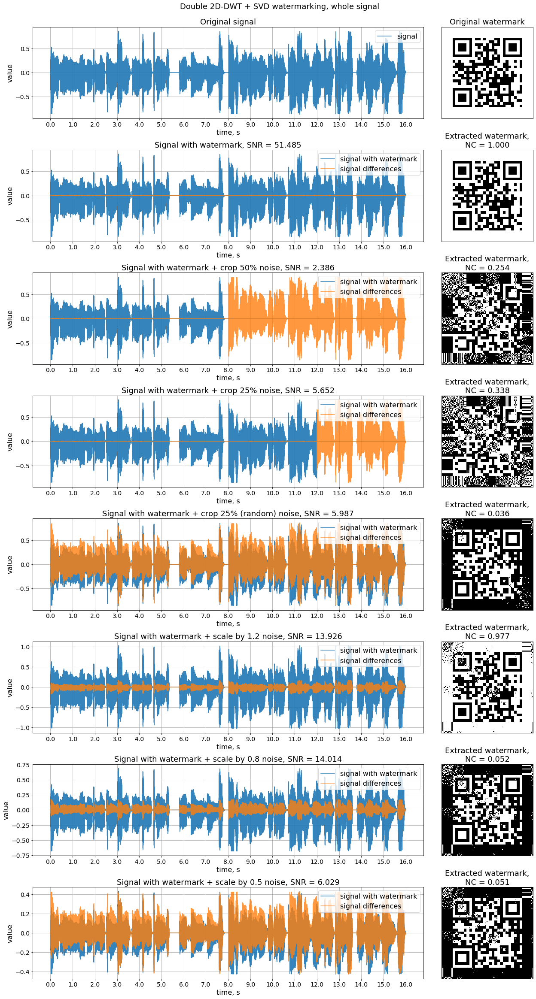

In [47]:
global_title = 'Double 2D-DWT + SVD watermarking, whole signal'

def dwt2_embed(signal):
    # embedding the watermark
    signal_mat = signal_to_2d(signal, w_height * 4)
    if signal_mat.shape[1] > 0:
        signal_mat = np.pad(signal_mat, ((0, 0), (0, 4 - signal_mat.shape[1] % 4)))

    # 2D-DWT
    LL1, (LH1, HL1, HH1) = dwt2(signal_mat, 'db1')
    LL2, (LH2, HL2, HH2) = dwt2(LL1, 'db1')
    LL2_w, wp_data = watermark_single(LL2, model=svd_wat, k=k)
    # inverse 2D-DWT
    LL1_w = idwt2((LL2_w, (LH2, HL2, HH2)), 'db1')
    signal_mat_w = idwt2((LL1_w, (LH1, HL1, HH1)), 'db1')
    signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
    
    return signal_w, wp_data

def dwt2_extract(signal_w, wp_data):
    # extracting the watermark
    signal_mat_w = signal_to_2d(signal_w, w_height * 4)
    LL1, (LH1, HL1, HH1) = dwt2(signal_mat_w, 'db1')
    LL2_w, (LH2, HL2, HH2) = dwt2(LL1, 'db1')
    
    return extract_from_single(LL2_w, svd_wat, wp_data, k=k)

signal_w, wp_data = dwt2_embed(signal)
extr_watermark = dwt2_extract(signal_w, wp_data)
extr_watermark = watermark_to_range(extr_watermark)

attck_signals_dwt2 = [signal, signal_w]
attck_waterm_dwt2 = [watermark, extr_watermark]
attck_titles_dwt2 = ['Original signal', 'Signal with watermark']

# attack
for mask, scale, name in zip(masks, scaling, attack_names):
    signal_wn = scale * signal_w
    signal_wn[mask] = 0.
    
    extr_watermark = dwt2_extract(signal_wn, wp_data)
    extr_watermark = watermark_to_range(extr_watermark)
    
    attck_signals_dwt2.append(signal_wn)
    attck_waterm_dwt2.append(extr_watermark)
    attck_titles_dwt2.append(f'Signal with watermark + {name} noise')

# plotting
plot_signal_attacks(attck_signals_dwt2, attck_waterm_dwt2, attck_titles_dwt2, 
                    figsize=(18, 32), global_title=global_title,
                    x_ticks=x_ticks, x_labels=x_labels)

#### 1D-DFT

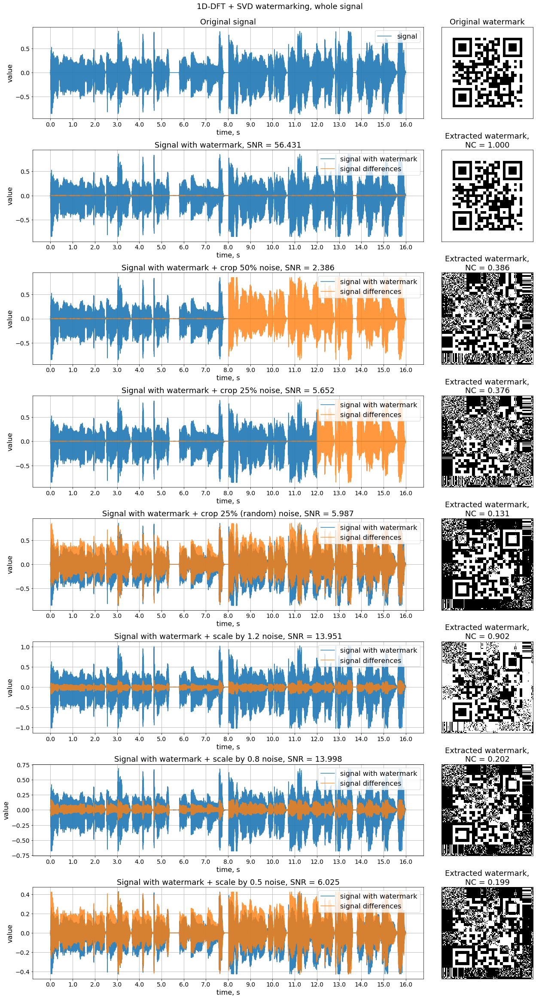

In [48]:
global_title = '1D-DFT + SVD watermarking, whole signal'

def dft_embed(signal):
    # embedding the watermark
    signal_freq = fft(signal)
    signal_ampl, signal_phase = signal_freq.real, signal_freq.imag
    signal_ampl_mat = signal_to_2d(signal_ampl, w_height)
    # embedding the watermark into a 2D matrix of the transform
    signal_ampl_mat_w, wp_data = watermark_single(signal_ampl_mat, model=svd_wat, k=k)
    signal_ampl_w = signal_to_1d(signal_ampl_mat_w, crop_length=signal_len)
    # inverse DFT
    signal_w = ifft(signal_ampl_w + 1j * signal_phase)
    
    return signal_w, wp_data

def dft_extract(signal_w, wp_data):
    # signal_w += np.random.rand.(*signal_w.shape)
    signal_freq = fft(signal_w)
    signal_ampl, signal_phase = signal_freq.real, signal_freq.imag
    signal_ampl_mat_w = signal_to_2d(signal_ampl, w_height)
    
    return extract_from_single(signal_ampl_mat_w, svd_wat, wp_data, k=k)

signal_w, wp_data = dft_embed(signal)
extr_watermark = dft_extract(signal_w, wp_data)
extr_watermark = watermark_to_range(extr_watermark)

attck_signals_dft = [signal, signal_w.real]
attck_waterm_dft = [watermark, extr_watermark]
attck_titles_dft = ['Original signal', 'Signal with watermark']

# attack
for mask, scale, name in zip(masks, scaling, attack_names):
    signal_wn = scale * signal_w
    signal_wn[mask] = 0.
    
    extr_watermark = dft_extract(signal_wn, wp_data)
    extr_watermark = watermark_to_range(extr_watermark)
    
    attck_signals_dft.append(signal_wn.real)
    attck_waterm_dft.append(extr_watermark)
    attck_titles_dft.append(f'Signal with watermark + {name} noise')

# plotting
plot_signal_attacks(attck_signals_dft, attck_waterm_dft, attck_titles_dft, 
                    figsize=(18, 32), global_title=global_title,
                    x_ticks=x_ticks, x_labels=x_labels)

### Scaling and cropping attacks  – framed embeddings

#### Time-domain

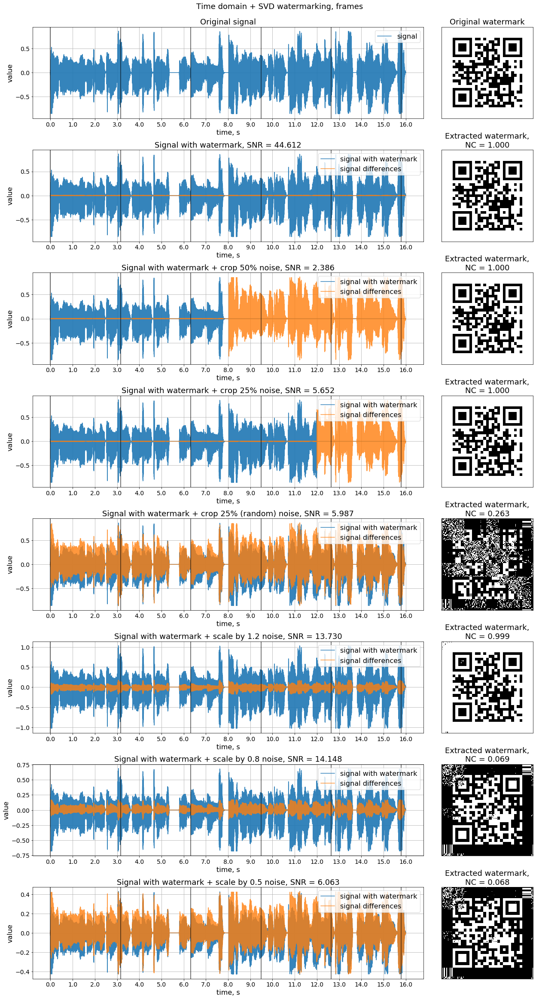

In [49]:
frame_width = 4 * w_width
global_title = 'Time domain + SVD watermarking, frames'
frame_borders = np.arange(0, signal_len + 1, 2 * w_height * frame_width)

# embedding the watermark
signal_mat = signal_to_2d(signal, w_height)
frames = split_into_frames(signal_mat, frame_width)
frames_w, wp_data = watermark_many(frames, model=svd_wat, k=k)
signal_mat_w = combine_frames(frames_w)
signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)

# extracting the watermark
signal_mat_w = signal_to_2d(signal_w, w_height)
frames_w = split_into_frames(signal_mat_w, frame_width)
extr_watermarks = extract_from_many(frames_w, svd_wat, wp_data, k=k)
extr_watermarks = [watermark_to_range(w) for w in extr_watermarks]

ncs = np.array([nc(watermark, w) for w in extr_watermarks])

attck_signals_td_fr = [signal, signal_w]
attck_waterm_td_fr = [watermark, extr_watermarks[np.argmax(ncs)]]
attck_titles_td_fr = ['Original signal', 'Signal with watermark']

# attack
for mask, scale, name in zip(masks, scaling, attack_names):
    signal_wn = scale * signal_w
    signal_wn[mask] = 0.
    
    signal_mat_w = signal_to_2d(signal_wn, w_height)
    frames_w = split_into_frames(signal_mat_w, frame_width)
    extr_watermarks = extract_from_many(frames_w, svd_wat, wp_data, k=k)
    extr_watermarks = [watermark_to_range(w) for w in extr_watermarks]
    
    ncs = np.array([nc(watermark, w) for w in extr_watermarks])
    
    attck_signals_td_fr.append(signal_wn)
    attck_waterm_td_fr.append(extr_watermarks[np.argmax(ncs)])
    attck_titles_td_fr.append(f'Signal with watermark + {name} noise')

# plotting
plot_signal_attacks(attck_signals_td_fr, attck_waterm_td_fr, attck_titles_td_fr, 
                    figsize=(18, 32), global_title=global_title, 
                    x_ticks=x_ticks, x_labels=x_labels, frame_borders=frame_borders)

#### 2D-DWT

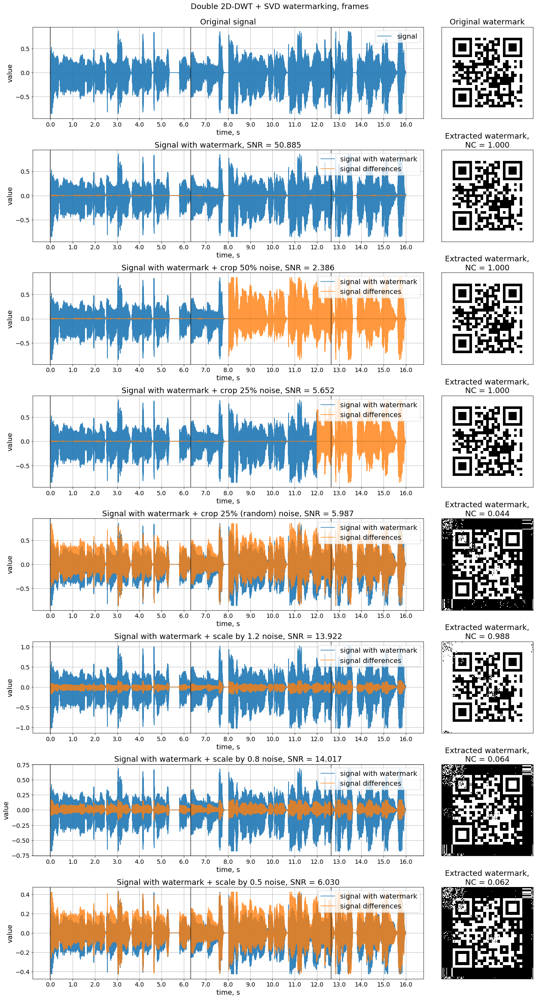

In [50]:
global_title = 'Double 2D-DWT + SVD watermarking, frames'
frame_borders = np.arange(0, signal_len + 1, 4 * w_height * frame_width)

def dwt2_embed(signal):
    # embedding the watermark
    signal_mat = signal_to_2d(signal, w_height * 4)
    if signal_mat.shape[1] > 0:
        signal_mat = np.pad(signal_mat, ((0, 0), (0, 4 - signal_mat.shape[1] % 4)))

    # 2D-DWT
    LL1, (LH1, HL1, HH1) = dwt2(signal_mat, 'db1')
    LL2, (LH2, HL2, HH2) = dwt2(LL1, 'db1')
    
    frames = split_into_frames(LL2, frame_width // 4)
    frames_w, wp_data = watermark_many(frames, model=svd_wat, k=k)
    LL2_w = combine_frames(frames_w)[:, :LL2.shape[1]]
    
    # inverse 2D-DWT
    LL1_w = idwt2((LL2_w, (LH2, HL2, HH2)), 'db1')
    signal_mat_w = idwt2((LL1_w, (LH1, HL1, HH1)), 'db1')
    
    signal_w = signal_to_1d(signal_mat_w, crop_length=signal_len)
    
    return signal_w, wp_data

def dwt2_extract(signal_w, wp_data):
    # extracting the watermark
    signal_mat_w = signal_to_2d(signal_w, w_height * 4)
    if signal_mat_w.shape[1] > 0:
        signal_mat_w = np.pad(signal_mat_w, ((0, 0), (0, 4 - signal_mat_w.shape[1] % 4)))
    LL1, (LH1, HL1, HH1) = dwt2(signal_mat_w, 'db1')
    LL2_w, (LH2, HL2, HH2) = dwt2(LL1, 'db1')
    frames_w = split_into_frames(LL2_w, frame_width // 4)
    
    return extract_from_many(frames_w, svd_wat, wp_data, k=k)

signal_w, wp_data = dwt2_embed(signal)
extr_watermarks = dwt2_extract(signal_w, wp_data)
extr_watermarks = [watermark_to_range(w) for w in extr_watermarks]
ncs = np.array([nc(watermark, w) for w in extr_watermarks])

attck_signals_dwt2_fr = [signal, signal_w]
attck_waterm_dwt2_fr = [watermark, extr_watermarks[np.argmax(ncs)]]
attck_titles_dwt2_fr = ['Original signal', 'Signal with watermark']

# attack
for mask, scale, name in zip(masks, scaling, attack_names):
    signal_wn = scale * signal_w
    signal_wn[mask] = 0.
    
    extr_watermarks = dwt2_extract(signal_wn, wp_data)
    extr_watermarks = [watermark_to_range(w) for w in extr_watermarks]
    ncs = np.array([nc(watermark, w) for w in extr_watermarks])
    
    attck_signals_dwt2_fr.append(signal_wn)
    attck_waterm_dwt2_fr.append(extr_watermarks[np.argmax(ncs)])
    attck_titles_dwt2_fr.append(f'Signal with watermark + {name} noise')

# plotting
plot_signal_attacks(attck_signals_dwt2_fr, attck_waterm_dwt2_fr, attck_titles_dwt2_fr, 
                    figsize=(18, 32), global_title=global_title,
                    x_ticks=x_ticks, x_labels=x_labels, frame_borders=frame_borders)

#### 1D-DFT

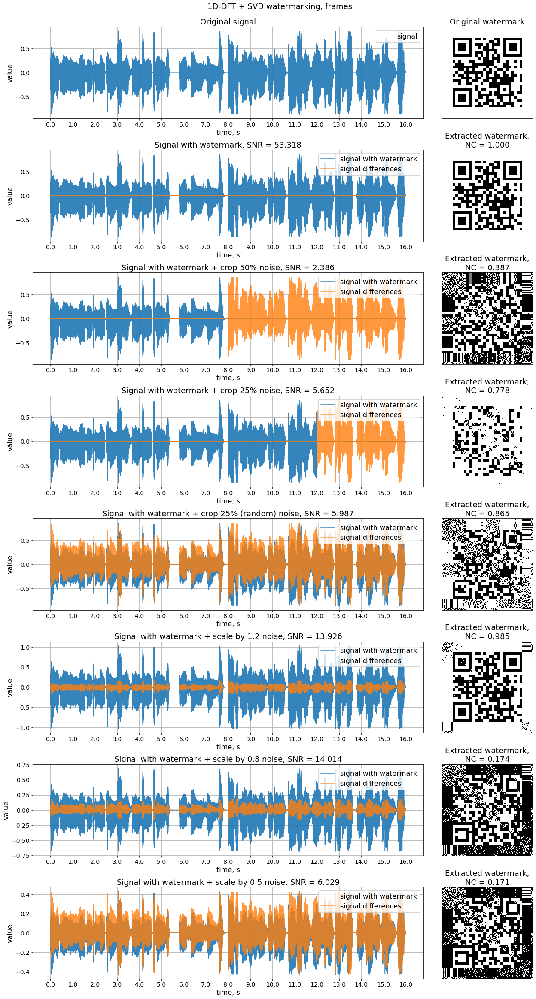

In [51]:
global_title = '1D-DFT + SVD watermarking, frames'
frame_borders = np.arange(0, signal_len + 1, 2 * w_height * frame_width)

def dft_embed(signal):
    # embedding the watermark
    signal_freq = fft(signal)
    signal_ampl, signal_phase = signal_freq.real, signal_freq.imag
    signal_ampl_mat = signal_to_2d(signal_ampl, w_height)
    
    frames = split_into_frames(signal_ampl_mat, frame_width)
    frames_w, wp_data = watermark_many(frames, model=svd_wat, k=k)
    signal_ampl_mat_w = combine_frames(frames_w)
    
    # embedding the watermark into a 2D matrix of the transform
    signal_ampl_w = signal_to_1d(signal_ampl_mat_w, crop_length=signal_len)
    # inverse DFT
    signal_w = ifft(signal_ampl_w + 1j * signal_phase)
    
    return signal_w, wp_data

def dft_extract(signal_w, wp_data):
    # signal_w += np.random.rand.(*signal_w.shape)
    signal_freq = fft(signal_w)
    signal_ampl, signal_phase = signal_freq.real, signal_freq.imag
    signal_ampl_mat_w = signal_to_2d(signal_ampl, w_height)
    frames_w = split_into_frames(signal_ampl_mat_w, frame_width)
    
    return extract_from_many(frames_w, svd_wat, wp_data, k=k)

signal_w, wp_data = dft_embed(signal)
extr_watermarks = dft_extract(signal_w, wp_data)
extr_watermarks = [watermark_to_range(w) for w in extr_watermarks]
ncs = np.array([nc(watermark, w) for w in extr_watermarks])

attck_signals_dft_fr = [signal, signal_w.real]
attck_waterm_dft_fr = [watermark, extr_watermarks[np.argmax(ncs)]]
attck_titles_dft_fr = ['Original signal', 'Signal with watermark']

# attack
for mask, scale, name in zip(masks, scaling, attack_names):
    signal_wn = scale * signal_w
    signal_wn[mask] = 0.
    
    extr_watermarks = dft_extract(signal_wn, wp_data)
    extr_watermarks = [watermark_to_range(w) for w in extr_watermarks]
    ncs = np.array([nc(watermark, w) for w in extr_watermarks])
    
    attck_signals_dft_fr.append(signal_wn.real)
    attck_waterm_dft_fr.append(extr_watermarks[np.argmax(ncs)])
    attck_titles_dft_fr.append(f'Signal with watermark + {name} noise')

# plotting
plot_signal_attacks(attck_signals_dft_fr, attck_waterm_dft_fr, attck_titles_dft_fr, 
                    figsize=(18, 32), global_title=global_title,
                    x_ticks=x_ticks, x_labels=x_labels, )

### Scaling and cropping attacks summary

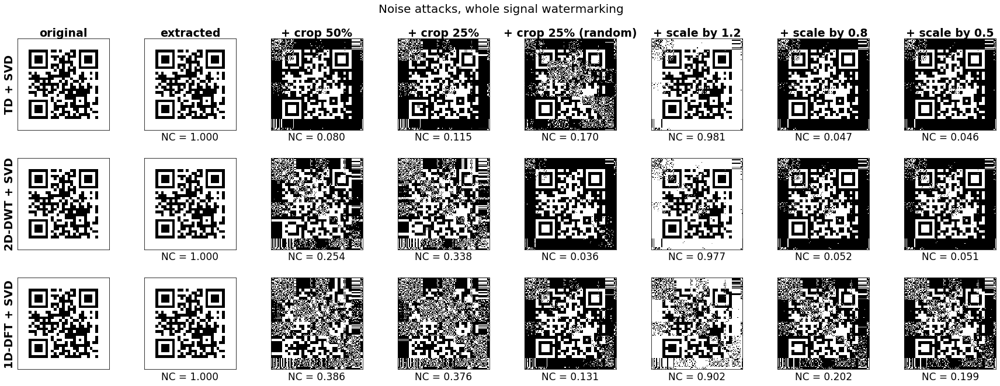

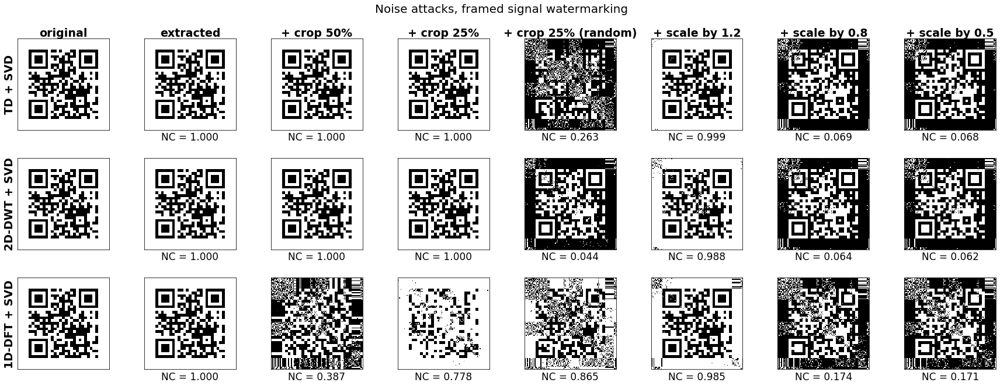

In [52]:
methods = ['TD + SVD', '2D-DWT + SVD', '1D-DFT + SVD']
attck_sum_names = ['original', 'extracted'] \
    + list(map(lambda x: '+ ' + x, attack_names))
title = 'Noise attacks, whole signal watermarking'

plot_watermarks_comp([attck_waterm_td, attck_waterm_dwt2, attck_waterm_dft], 
                rows=len(methods), cols=len(attck_sum_names), figsize=(24, 9),
                title=title, column_names=attck_sum_names, row_names=methods)

title = 'Noise attacks, framed signal watermarking'
plot_watermarks_comp([attck_waterm_td_fr, attck_waterm_dwt2_fr, attck_waterm_dft_fr], 
                rows=len(methods), cols=len(attck_sum_names), figsize=(24, 9),
                title=title, column_names=attck_sum_names, row_names=methods)